[<img src=https://raw.githubusercontent.com/barauna-lo/CAP4213-Deep-Learning/main/logoinpe.png align=”middle”>](https://www.gov.br/inpe/pt-br)

[<center><img src="https://github.com/barauna-lo/Deep-Learning/blob/main/LogoCAP.png?raw=true" width = 450 align="middle"></center>](http://www.inpe.br/posgraduacao/cap/)


# CAP-345-3 - Inteligência Artificial

* [Luan Orion Baraúna](https://www.linkedin.com/in/luan-orion-barauna/)
* Luis Ricardo Arantes Filho
* Rubens Sautter

## Modelo simples de classificação de tipo de ruido em imagens

Gerador de Ruidos: 
An parameter of correction has been used (s):

$$
FFT(f(w)) = \text{gauss}(0,\sigma) * (1/w^\beta)^{(\beta s/2) }
$$

Frequencies are measured in multidimensional space by the frequency euclidian distance.

Parameter for all noise types
size = 128
wn = cNoise(0,(size,size),maxCorrections=100,maxAvgError=0.001, eta=0.05)

#### Coordenador: Dr. Reinaldo R. Rosa
#### National Institute for Space Research

# Librarys

In [25]:
%%capture
! git clone https://github.com/rsautter/Noisy-Complex-Ginzburg-Landau.git

In [1]:
%cd Noisy-Complex-Ginzburg-Landau/

/home/barauna/Documentos/PN_Vision_Noise/Noisy-Complex-Ginzburg-Landau


In [2]:
#import the cNoise function
import cNoise as cNoise
import numpy as np
import pandas as pd
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt
import cv2

%cd ..

/home/barauna/Documentos/PN_Vision_Noise


# Functions

In [3]:
def getHistogramSlices(mat):
    freq = np.fft.fftfreq(mat.shape[0])
    p = (freq > 1e-12)
    betas= []
    for i in range(mat.shape[0]): 
        psd = np.fft.fft(mat[i])
        psd = (psd*np.conj(psd)).real
        b,_ = np.polyfit(np.log(freq[p]),np.log(psd[p]),deg=1)
        betas.append(-b)
    for i in range(mat.shape[1]):
        psd = np.fft.fft(mat[:,i])
        psd = (psd*np.conj(psd)).real
        b,_ = np.polyfit(np.log(freq[p]),np.log(psd[p]),deg=1)
        betas.append(-b)
    return betas

def getMONOHistogramSlices(data):
    betas = []
    for i in range(len(data)):
        freq = np.fft.fftfreq(len(data[i]))
        p = (freq > 1e-12)
        psd = np.fft.fft(data[i])
        psd = (psd*np.conj(psd)).real
        b,_ = np.polyfit(np.log(freq[p]),np.log(psd[p]),deg=1)
        betas.append(-b)
    return betas
#radio = getMONOHistogramSlices(image_data)


def getBiHistogramSlices(mat):
    freq = np.fft.fftfreq(mat.shape[0])
    p = (freq > 1e-12)
    betas_x, betas_y = [], []
    for i in range(mat.shape[0]):
        psd = np.fft.fft(mat[i])
        psd = (psd*np.conj(psd)).real
        b,_ = np.polyfit(np.log(freq[p]),np.log(psd[p]),deg=1)
        betas_x.append(-b)
    for i in range(mat.shape[1]):
        psd = np.fft.fft(mat[:,i])
        psd = (psd*np.conj(psd)).real
        b,_ = np.polyfit(np.log(freq[p]),np.log(psd[p]),deg=1)
        betas_y.append(-b)
    return betas_x,betas_y    

import numpy as np
import matplotlib.pyplot as plt

# Define the mean and covariance matrix of the Gaussian distribution
def plot_psd_conter(image,title):
  data_x,data_y = getBiHistogramSlices(image)
  mu = np.array([np.mean(data_x), np.mean(data_y)])
  cov = np.cov(data_x,data_y)#np.array([[1, 0], [0, 1]])

  # Define a grid of x and y values
  x = data_x#np.linspace(-3, 3, 100)
  y = data_y#np.linspace(-3, 3, 100)
  X, Y = np.meshgrid(x, y)

  # Evaluate the Gaussian distribution at each point on the grid
  Z = np.zeros_like(X)
  for i in range(len(x)):
      for j in range(len(y)):
          p = np.array([x[i], y[j]])
          Z[j,i] = np.exp(-0.5*(p-mu).T @ np.linalg.inv(cov) @ (p-mu))

  # Create a contour plot of the Gaussian distribution
  plt.contour(X, Y, Z)
  plt.title('$\\beta_c$ = '+str(title)+' - $\\beta_\\mu$ ='+str(abs(round(np.mean(data_x+data_y),5))))
  # plt.xlabel('x')
  # plt.ylabel('y')
  #plt.show()

def plot_psd(data,label='PSD',color='k',is_subplot = False):
  '''
  This functions will show the PSD representation for any time series
  '''
  ft = np.fft.fft(data)
  ft = np.real(ft*np.conj(ft))
  freq = np.fft.fftfreq(len(ft))
  seq = np.argsort(freq)
  a,b = np.polyfit(np.log(freq[freq>0.0]),np.log(ft[freq>0.0]),deg=1)
  text = "{} {}f + {}".format(label,np.round(a,3),np.round(b,3))
  #plota o psd
  if is_subplot:
    return freq[seq],ft[seq]
  else:
    return plt.loglog(freq[seq],ft[seq],color=color,label=text)    


# Data Set
You can *Generate* or *Load dataset*

## Generate Data Set

In [5]:
#Generating the data

images_for_classes = 1

#Generating several colored noise from `cNoise` mudule
#%%capture 
size = 1024
min_beta = 0
max_beta = 3
n_classes = 5
noise = []
beta  = []

for i in range(0,(max_beta-min_beta)*n_classes+1):
  print(' Noise: Beta '+str(i/n_classes))
print(f'It will be {i} classes and {images_for_classes} images for classes')

 Noise: Beta 0.0
 Noise: Beta 0.2
 Noise: Beta 0.4
 Noise: Beta 0.6
 Noise: Beta 0.8
 Noise: Beta 1.0
 Noise: Beta 1.2
 Noise: Beta 1.4
 Noise: Beta 1.6
 Noise: Beta 1.8
 Noise: Beta 2.0
 Noise: Beta 2.2
 Noise: Beta 2.4
 Noise: Beta 2.6
 Noise: Beta 2.8
 Noise: Beta 3.0
It will be 15 classes and 1 images for classes


In [5]:
# for j in range(0,images_for_classes):
#   for i in range(0,(max_beta-min_beta)*n_classes+1):
#     noise.append(cNoise.cNoise(i/n_classes,(size,size),maxCorrections=100,maxAvgError=0.001, eta=0.05))
#     beta.append(i/n_classes)
#     print('data_set '+str(j)+' Noise: Beta '+str(i/n_classes))

# df_data = pd.DataFrame({'image':noise, 'class':beta})
# df_data
# df_data.to_pickle('MultipleCNN_Noise2.plk')


## Load Data

### Load Kagle Data set download

Here we will download a dataset from kagle, place it on google drive and then download the file. As the dataset has already been downloaded once in google drive I will just access the `.zip` file in the drive and do the `--unzip` in the home folder of google colab.

https://medium.com/analytics-vidhya/how-to-download-kaggle-datasets-into-google-colab-via-google-drive-dcb348d7af07


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# import os
# #os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle"
# %cd /content/drive/MyDrive/Kaggle/
# #!kaggle datasets download -d luanorionbarana/2d-colored-noise
# !unzip "2d-colored-noise.zip" -d "/content/"
# %cd ..
# %cd ..
# %cd ..

Mounted at /content/drive
/content/drive/MyDrive/Kaggle
unzip:  cannot find or open 2d-colored-noise.zip, 2d-colored-noise.zip.zip or 2d-colored-noise.zip.ZIP.
/content/drive/MyDrive
/content/drive
/content


### Load From PC

In [8]:
#os.chdir('/content/drive/MyDrive/INPE/CCN_For_Noise_Classification/')
#df_data_all =  pd.read_pickle('/content/drive/MyDrive/INPE/CCN_For_Noise_Classification/MultipleCNN_Noise2.plk')
df_data_all =  pd.read_pickle('/home/barauna/Documentos/PN_Vision_Noise/MultipleCNN_Noise2.plk')


# Data Analyses

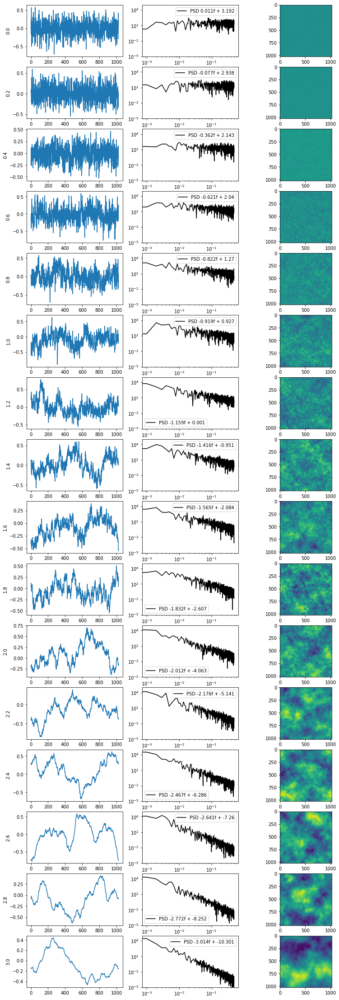

In [30]:
plt.figure(figsize = (13,40))

for i in range(16):
   plt.subplot(16,3,3*i+1)
   plt.plot(df_data_all['image'][i][0])
   plt.ylabel(df_data_all['class'][i])

   plt.subplot(16,3,3*i+2)
   plot_psd(df_data_all['image'][i][0])
   plt.ylim(1e-5,1e5)
   plt.legend()

   plt.subplot(16,3,3*i+3)
   #plt.title('β = '+str(df_data_all['class'][i]))
   plt.imshow(df_data_all['image'][i])   



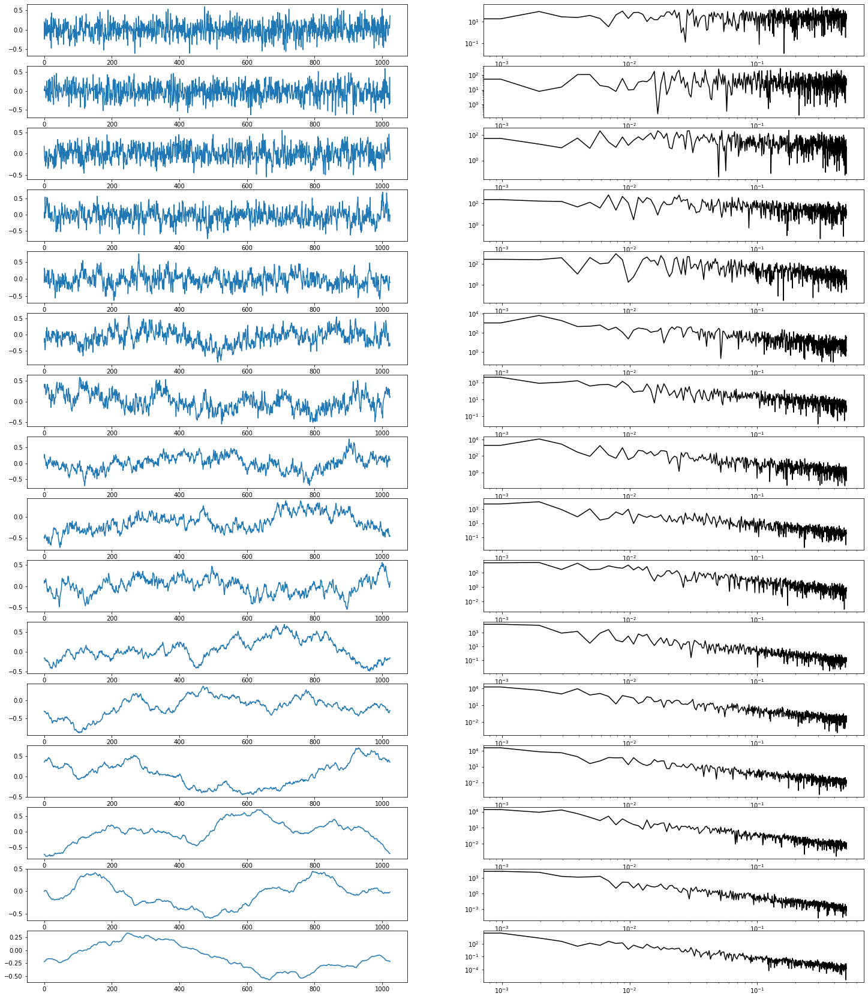

In [ ]:
plt.figure(figsize=(25,30))
for i in range(16):
   plt.subplot(16,2,2*i+1)
   plt.plot(df_data_all['image'][i][15])
   plt.subplot(16,2,2*i+2)
   plot_psd(df_data_all['image'][i][15])
  
   #plt.ylabel(df_data_all['class'][i])

### Ploting Data 🗓️

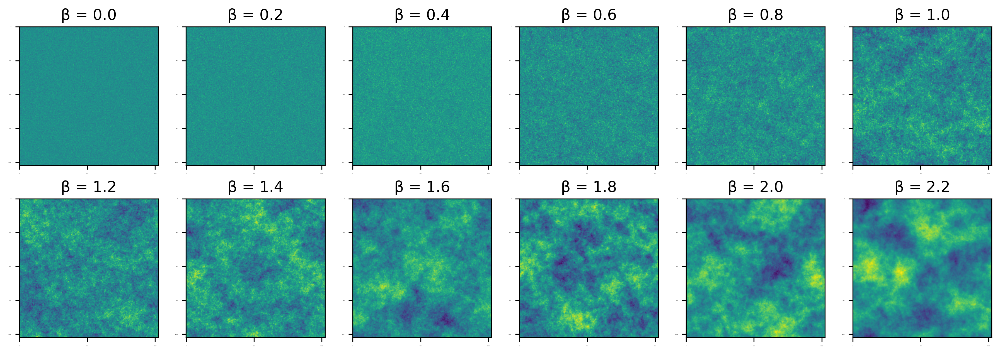

In [22]:
#plt.figure(figsize=(20,10),dpi=50)
plt.figure(figsize=(15,5),dpi=300)
for i in range(0,12):
  plt.subplot(2,6,i+1)
  #set space between subplots
  #plt.subplots_adjust(wspace=0.5, hspace=0.5)
  #Widden x and y axis axis values
  plt.xticks(fontsize=0)
  #Hiden y ticks
  plt.yticks(fontsize=0)
  plt.title('β = '+str(df_data_all['class'][i]),fontsize=13)
  plt.imshow(df_data_all['image'][i])
plt.savefig('noise2D.pdf',bbox_inches='tight')
plt.show()  


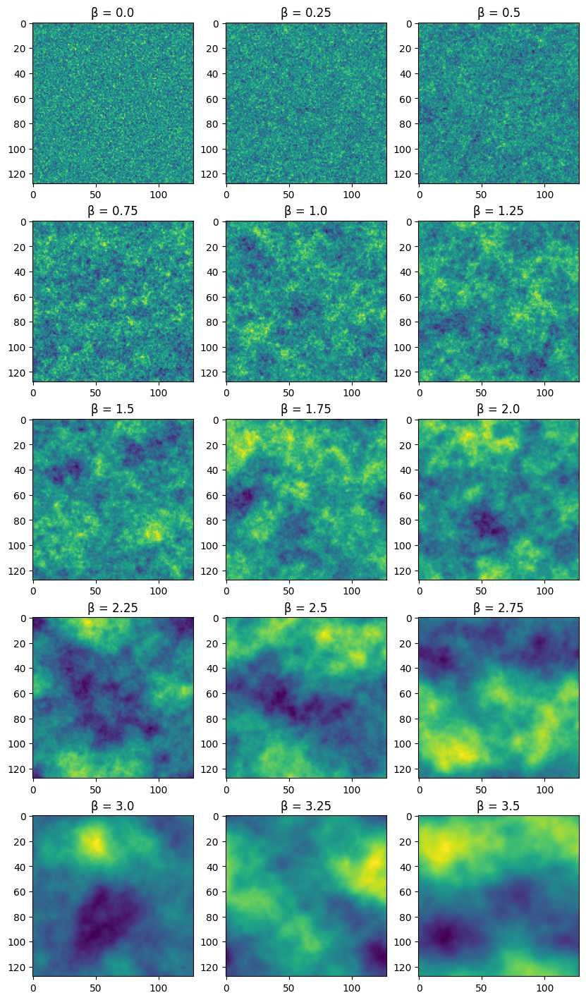

In [ ]:
#plt.figure(figsize=(20,10),dpi=50)
plt.figure(figsize=(10,18),dpi=100)
for i in range(0,15):
  plt.subplot(5,3,i+1)
  plt.title('β = '+str(df_data_all['class'][i]))
  plt.imshow(df_data_all['image'][i])
plt.savefig('noise.pdf',bbox_inches='tight')
plt.show()  


In [ ]:
df_data_all.columns

Index(['image', 'class'], dtype='object')

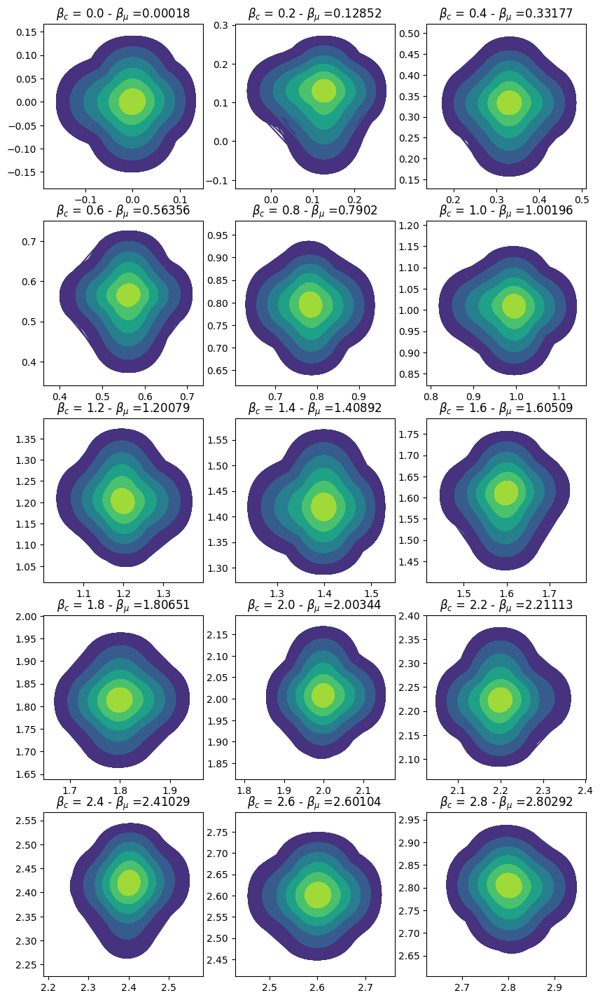

In [ ]:
#plt.figure(figsize=(20,10),dpi=50)
plt.figure(figsize=(10,18),dpi=100)
for i in range(0,15):
  plt.subplot(5,3,i+1)
  plot_psd_conter(df_data_all['image'][i],df_data_all['class'][i])
  # plt.axhline(df_data_all['class'][i],linesytle ='--',color = 'red')
  # plt.axvline(df_data_all['class'][i],linesytle ='--',color = 'red') 
#plt.savefig('noise.pdf',bbox_inches='tight')
plt.show() 

# Pre-Processing

We will generate the dataset that we will use for classification in the convolutional neural network. We will use Rubens Sauter's code to generate these noises in two dimensions. We will generate 31 noise classes. And we will generate a total of 100 218x218 images per class. As this code is very time consuming, we will generate the images and host them on google drive.

In [ ]:
#testing changing variables
#df_rect_2 = df_rect_1
#df_rect_1 = df_data
df_rect_1 = df_data_all

## GENERATE SETS

In [ ]:
#Why save this dataframe
path_dataframe = os.getcwd() + '/Dataframes'
##Salvar esse DF       
def salvaDataFrames_pkl(dataFrame,caminhoSaida,nomeArquivo):
    dataFrame.to_pickle(caminhoSaida+'/'+nomeArquivo, compression='infer')

salvaDataFrames_pkl(df_rect_1,path_dataframe,'Data_Frame_Noise_images.pkl')

In [ ]:
#ADJUST IMG DIM
from PIL import Image
import cv2 
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, img_to_array, load_img
image_list = []
i = 0
for i in range(len(df_rect_1)):
    #print(i)
    #old_im = cv2.imread(df_rect_1.loc[i,'image_data'])    
    gray = cv2.resize(df_rect_1.loc[i,'image'],(128,128),cv2.INTER_AREA)
    #gray = cv2.cvtColor(res, cv2.COLOR_BGR2GRAY) #Whay put on gray?
    #print(gray.shape)
    image_list.append(gray)
    #print(i)

In [ ]:
#Alocating the labels for the classes
labels = np.array(df_rect_1['class'])

In [ ]:
#How diferent classes are on the labels?
from collections import Counter
n_class = len(Counter(labels).values()) # equals to list(set(words))
#https://stackoverflow.com/questions/12282232/how-do-i-count-occurrence-of-unique-values-inside-a-list
n_class

15

## Spliting traing and test data sets

In [ ]:
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.model_selection import train_test_split
import numpy as np
from tensorflow import keras
from tensorflow.keras import layers

'''
Montar Conjunto de Treinamento - Testes IMAGENS ARTIFICIAIS
'''
#Dividindo Conjunto de treinamento e de Teste
X_train, X_test, y_train, y_test = train_test_split(
    np.asarray(image_list),
    np.asarray(labels/10),
    test_size=0.20, # 80% para treino e 20% para test
    shuffle=True,
    random_state=42,
)

#Scale images to the [0, 1] range
# X_train = X_train.reshape(len(X_train),128,128,1) 
# X_test = X_test.reshape(len(X_test),128,128,1)

X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255
print(X_train.shape)


# convert class vectors to binary class matrices
y_train = keras.utils.to_categorical(y_train, n_class)
y_test = keras.utils.to_categorical(y_test, n_class)

(120, 128, 128)


In [ ]:
#Settings the train and test data 
path_datasets = os.getcwd() + '/Sets/'

np.save(path_datasets + 'X_train.npy', X_train)
np.save(path_datasets + 'X_test.npy', X_test)
np.save(path_datasets + 'y_train.npy', y_train)
np.save(path_datasets + 'y_test.npy', y_test)

In [ ]:
## TRAINING STEP
path_model = os.getcwd() + '/Model/'

# CNN Model

In [ ]:
'''
# =============================================================================
# NEURAL MODEL - CONVOLUTIONAL NEURAL NETWORK - SIMPLE - RETURNS POINTS (X,Y)
# =============================================================================
'''
from keras import layers
from keras import models
from keras import optimizers
#from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
#from keras.models import Sequential
from tensorflow.keras.models import Sequential
#from keras.utils import multi_gpu_model
#from tensorflow.keras.utils import multi_gpu_model

'''
# =============================================================================
# TESTANDO OUTRAS ABORDAGENS -- O MELHOR MODELO - TEST 1
#=============================================================================
'''
model = keras.Sequential(
    [
        keras.Input(shape=(128,128,1)),
        layers.Conv2D(32, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Conv2D(64, kernel_size=(3, 3), activation="relu"),
        layers.MaxPooling2D(pool_size=(2, 2)),
        layers.Flatten(),
        layers.Dropout(0.5),
        layers.Dense(n_class, activation="softmax"),
    ]
)

model.summary()

batch_size = 128
epochs = 12

model.compile(loss="categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
history = model.fit(X_train, 
                    y_train, 
                    batch_size=batch_size, 
                    epochs=epochs,
                    validation_split=0.1)
test_loss, test_acc = model.evaluate(X_test, y_test)
print('test_mse:', test_acc)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      320       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 57600)             0         
                                                                 
 dropout (Dropout)           (None, 57600)             0

In [ ]:
# def salvarmodelo(nome,modelo):
#     #Salvando
#     filename = nome+'.sav'
#     pickle.dump(modelo, open(filename, 'wb'))
    

# def salvardicionario(nome, history):
#     #Salvando Dicionario
#     w = csv.writer(open(nome+'.csv', "w"))
#     for key, val in history.items():
#         w.writerow([key, val])    
        
# #Estatisticas do modelo
# #cria dicionario
# history_dict = history.history
# history_dict.keys()
# #Salvando Dicionario
# salvardicionario(path_model+"History_noise_class",history_dict)
# model.save(path_model+"Cnn_model_noise_class.h5")

NameError: ignored

In [ ]:
## VERIFY STATS AND TRAINING
def abreDataFrame(caminho,nomeArq):
    dataFrame = pd.read_pickle(caminho + nomeArq)#READ PICKLE MUITO IMPORTANTE!!!!!
    return dataFrame

def abreDataFramecsv(caminho,nomeArq):
    dataFrame = pd.read_csv(caminho + nomeArq,names=['Metrics','Values'])#READ PICKLE MUITO IMPORTANTE!!!!!
    return dataFrame

## Avaliating Model

In [ ]:
#ConvNet_1D_ARQ1_MULTIFILTRO
nome_History = 'History_noise_class.csv'
nome_Model = "Cnn_model_noise_class.h5"

In [ ]:
history

,Metrics,Values
0,loss,"[1.098420262336731, 1.0460158586502075, 0.9191..."
1,accuracy,"[0.6388888955116272, 1.0, 1.0, 1.0, 1.0, 1.0, ..."
2,val_loss,"[1.0467652082443237, 0.9206280708312988, 0.710..."
3,val_accuracy,"[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, ..."


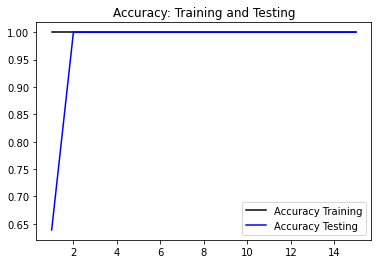

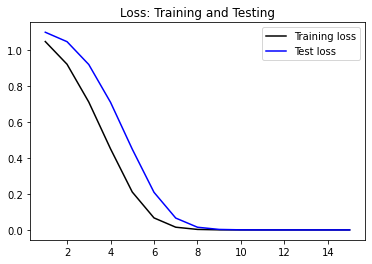

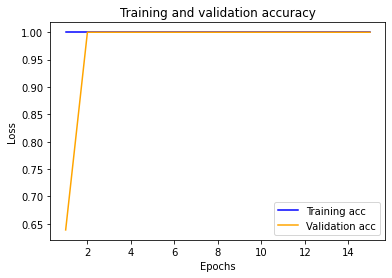

In [ ]:
'''
Plotando as Curvas de Validação e de Erro - Aprendizado do Modelo
'''
history = abreDataFramecsv(path_model, nome_History)
#history = history.to_dict()
acc = history.loc[3,'Values']
val_acc = history.loc[1,'Values']
loss = history.loc[2,'Values']
val_loss = history.loc[0,'Values']

from ast import literal_eval

acc = literal_eval(acc)
val_acc = literal_eval(val_acc)
loss = literal_eval(loss)
val_loss = literal_eval(val_loss)


epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'k', label='Accuracy Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy Testing')
plt.title('Accuracy: Training and Testing')
plt.legend()
plt.figure()
plt.plot(epochs, loss,'k', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Test loss')
plt.title('Loss: Training and Testing')
plt.legend()
plt.show()
 
plt.figure()
acc_values = acc
val_acc_values = val_acc
plt.plot(epochs, acc, 'blue', label='Training acc')
plt.plot(epochs, val_acc_values, 'orange', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
ls

 2DPSD.ipynb                  MultipleCNN_Noise.plk            results.pdf
'CNN for Noise class.ipynb'   Noise_images/                    Sets/
 cNoise.py                    Noisy-Complex-Ginzburg-Landau/   white.jpeg
 Dataframes/                  pink.jpeg
 Model/                       red.jpeg


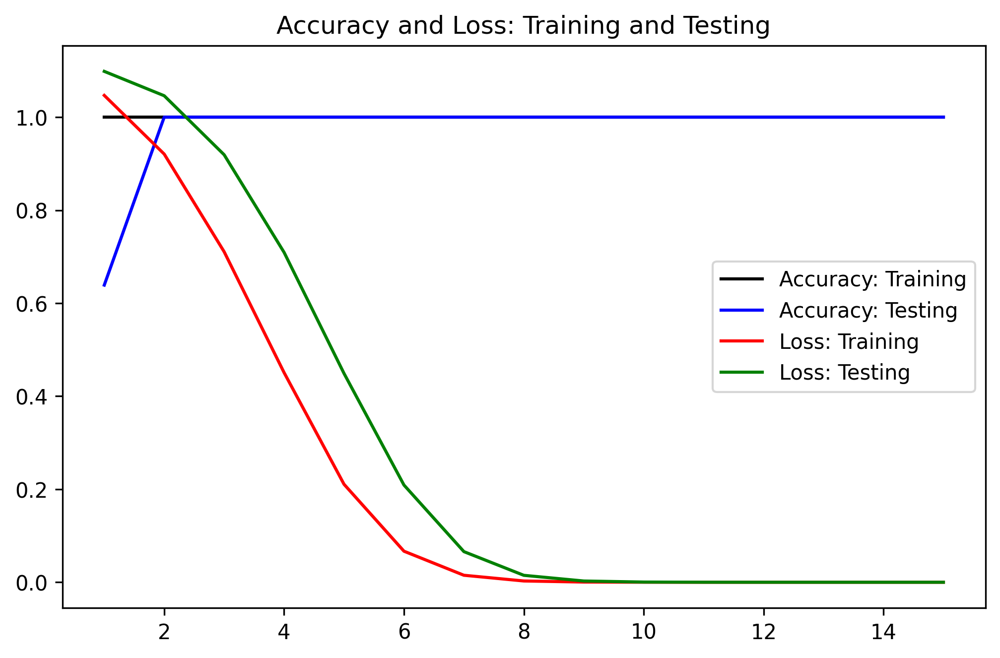

In [ ]:
figure(figsize=(8,5),dpi=300)
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc,'k', label='Accuracy: Training')
plt.plot(epochs, val_acc, 'b', label='Accuracy: Testing')

plt.plot(epochs, loss,'r', label='Loss: Training ')
plt.plot(epochs, val_loss, 'g', label='Loss: Testing')

plt.title('Accuracy and Loss: Training and Testing')
plt.legend()

plt.savefig('results.pdf',bbox_inches='tight')

plt.show()




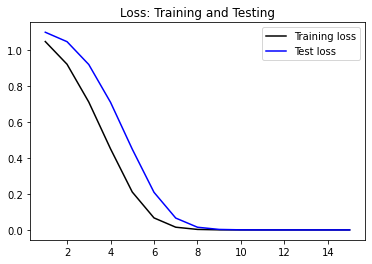

In [ ]:
plt.figure()
plt.plot(epochs, loss,'k', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Test loss')
plt.title('Loss: Training and Testing')
plt.legend()
plt.show()
 

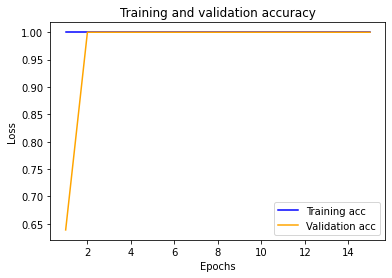

In [ ]:
plt.figure()
acc_values = acc
val_acc_values = val_acc
plt.plot(epochs, acc, 'blue', label='Training acc')
plt.plot(epochs, val_acc_values, 'orange', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

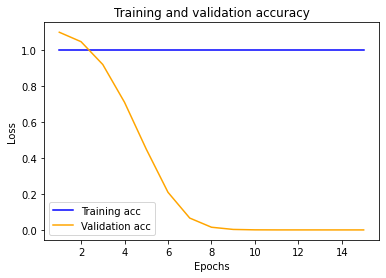

In [ ]:
plt.figure()
acc_values = acc
val_acc_values = val_loss
plt.plot(epochs, acc, 'blue', label='Training acc')
plt.plot(epochs, val_acc_values, 'orange', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
'''
# =============================================================================
# COMPUTANDO ESTATISTICAS
# =============================================================================
'''
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import mean_squared_error
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.model_selection import validation_curve

def computaStats_Classification(modelo,nome,X_a,y_a):
    print("Model Statistics -"+nome)
    #predição
    y_pred = modelo.predict([X_a])
    y_true = y_a
    #Convert predictions classes to one hot vectors 
    Y_pred_classes = np.argmax(y_pred,axis = 1) 
    #Convert validation observations to one hot vectors
    Y_true = np.argmax(y_a,axis = 1) 
    #MEAN SQUARE ERROR
    
    print("Mean Square Error: ", mean_squared_error(Y_true, Y_pred_classes))
    
    #Acurácia
    print("Accuracy: ", accuracy_score(Y_true, Y_pred_classes))
    
    #Precisão
    print("Precision: ", precision_score(Y_true, Y_pred_classes,average=None))
    
    #Recall
    print("Recall: ", recall_score(Y_true, Y_pred_classes,average=None))
    
    #F1 - Score
    print("F1 -Score: ", f1_score(Y_true, Y_pred_classes,average=None))
    

computaStats_Classification(model,'ConvNet_Noise_Class - Train',X_train,y_train)
# print("--------**********-------------***********---------------**************")
computaStats_Classification(model,'ConvNet_Noise_Class - Teste',X_test,y_test)

Model Statistics -ConvNet_Noise_Class - Train
4/4 [==============================] - 1s 171ms/step
Mean Square Error:  0.0
Accuracy:  1.0
Precision:  [1.]
Recall:  [1.]
F1 -Score:  [1.]
Model Statistics -ConvNet_Noise_Class - Teste
1/1 [==============================] - 0s 181ms/step
Mean Square Error:  0.0
Accuracy:  1.0
Precision:  [1.]
Recall:  [1.]
F1 -Score:  [1.]


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

# import os
# #os.environ['KAGGLE_CONFIG_DIR'] = "/content/drive/MyDrive/Kaggle"
# %cd /content/drive/MyDrive/Kaggle/
# #!kaggle datasets download -d luanorionbarana/2d-colored-noise
# !unzip "2d-colored-noise.zip" -d "/content/"
# %cd ..
# %cd ..
# %cd ..
# df_data_all =  pd.read_pickle('MultipleCNN_Noise.plk')

# Using Ordpy 
https://doi.org/10.1063/5.0049901

In [1]:
# %%capture
# ! git clone https://github.com/arthurpessa/ordpy.git

In [4]:
import os 
os.chdir('ordpy/examples')

In [5]:
import numpy as np

#if you have not installed the package, you can run the line below instead of importing ordpy.
%run ../ordpy/ordpy.py
# from ordpy import *

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import colorednoise as cn

import string
import glob
import warnings

#extend notebook
from IPython.core.display import display, HTML
display(HTML("<style>.container {width:99.5% !important;} </style>"))

In [6]:
cd ..

/home/barauna/Documentos/PN_Vision_Noise/ordpy


In [7]:
cd ..

/home/barauna/Documentos/PN_Vision_Noise


## Functions

In [8]:
def plot_psd(data,label='PSD',color='k',is_subplot = False):
  '''
  This functions will show the PSD representation for any time series
  '''
  ft = np.fft.fft(data)
  ft = np.real(ft*np.conj(ft))
  freq = np.fft.fftfreq(len(ft))
  seq = np.argsort(freq)
  a,b = np.polyfit(np.log(freq[freq>0.0]),np.log(ft[freq>0.0]),deg=1)
  text = "{} {}f + {}".format(label,np.round(a,3),np.round(b,3))
  #plota o psd
  if is_subplot:
    return freq[seq],ft[seq]
  else:
    return plt.loglog(freq[seq],ft[seq],color=color,label=text)    

def plot_hc(dx=6,show_legend = True,show_label_x = True,show_label_y = True):
  hc_max_curve = maximum_complexity_entropy(dx=6).T
  hc_min_curve = minimum_complexity_entropy(dx=6, size=719).T

  hmin, cmin = hc_min_curve  #(this variable is defined in the cell above)
  hmax, cmax = hc_max_curve  #(this variable is defined in the cell above)
  plt.plot(hmin, cmin, linewidth=1.5, color='#202020', zorder=0)
  plt.plot(hmax, cmax, linewidth=1.5, color='#202020', zorder=0)

  if show_label_x:
    plt.xlabel('Permutation entropy, $H$')
  if show_label_y:
    plt.ylabel('Statistical complexity, $C$')
  if show_legend:
    plt.annotate(f'$d_x = {dx}$', (.5, .2),
                va='center',
                ha='center',
                xycoords='axes fraction',
                fontsize=20,
                bbox={
                    'boxstyle': 'round',
                    'fc': 'white',
                    'alpha': 1,
                    'ec': '#d9d9d9'
                })
#plot_hc(2,False)

In [12]:
# from google.colab import drive
# drive.mount('/content/drive')

In [9]:
import pandas as pd
df_data_all =  pd.read_pickle('/home/barauna/Documentos/PN_Vision_Noise/MultipleCNN_Noise2.plk')
df_data_all2 =  pd.read_pickle('/home/barauna/Documentos/PN_Vision_Noise/MultipleCNN_Noise.plk')

## Reproducing the original paper

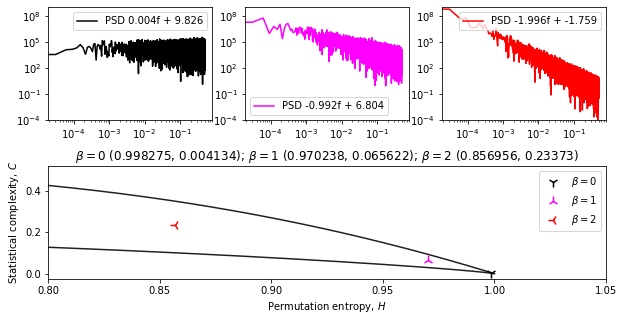

In [10]:

samples1 = 2**15 # = 32768

wn1 = cn.powerlaw_psd_gaussian(0, samples1)
pn1 = cn.powerlaw_psd_gaussian(1, samples1)
rn1 = cn.powerlaw_psd_gaussian(2, samples1)

hc_wn1 = np.mean([complexity_entropy(wn1, dx=6) for _ in range(10)],axis=0)
hc_pn1 = np.mean([complexity_entropy(pn1, dx=6) for _ in range(10)],axis=0)
hc_rn1 = np.mean([complexity_entropy(rn1, dx=6) for _ in range(10)],axis=0)
plt.figure(figsize=(10,5))
plt.subplot(2,3,1)
plot_psd(wn1,color='k')
plt.ylim(1e-4,1e9)
plt.legend()
plt.subplot(2,3,2)
plot_psd(pn1,color='magenta')
plt.legend()
plt.ylim(1e-4,1e9)
plt.subplot(2,3,3)
plot_psd(rn1,color='r')
plt.ylim(1e-4,1e9)
plt.legend()

plt.subplot(2,3,((4,6)))
plt.subplots_adjust(hspace=0.4)
plot_hc(show_legend=False)
plt.scatter((hc_wn1[0]),(hc_wn1[1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
plt.scatter((hc_pn1[0]),(hc_pn1[1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
plt.scatter((hc_rn1[0]),(hc_rn1[1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
plt.xlim(0.8,1.05)
plt.legend()
plt.title(f'$\\beta = 0 $ {round((hc_wn1[0]),6),round((hc_wn1[1]),6)}; $\\beta = 1 $ {round((hc_pn1[0]),6),round((hc_pn1[1]),6)}; $\\beta = 2 $ {round((hc_rn1[0]),6),round((hc_rn1[1]),6)}')
plt.savefig('PSD_HC.pdf',dpi=300)



## Study the impact of $d_x$ and the `len(series)`

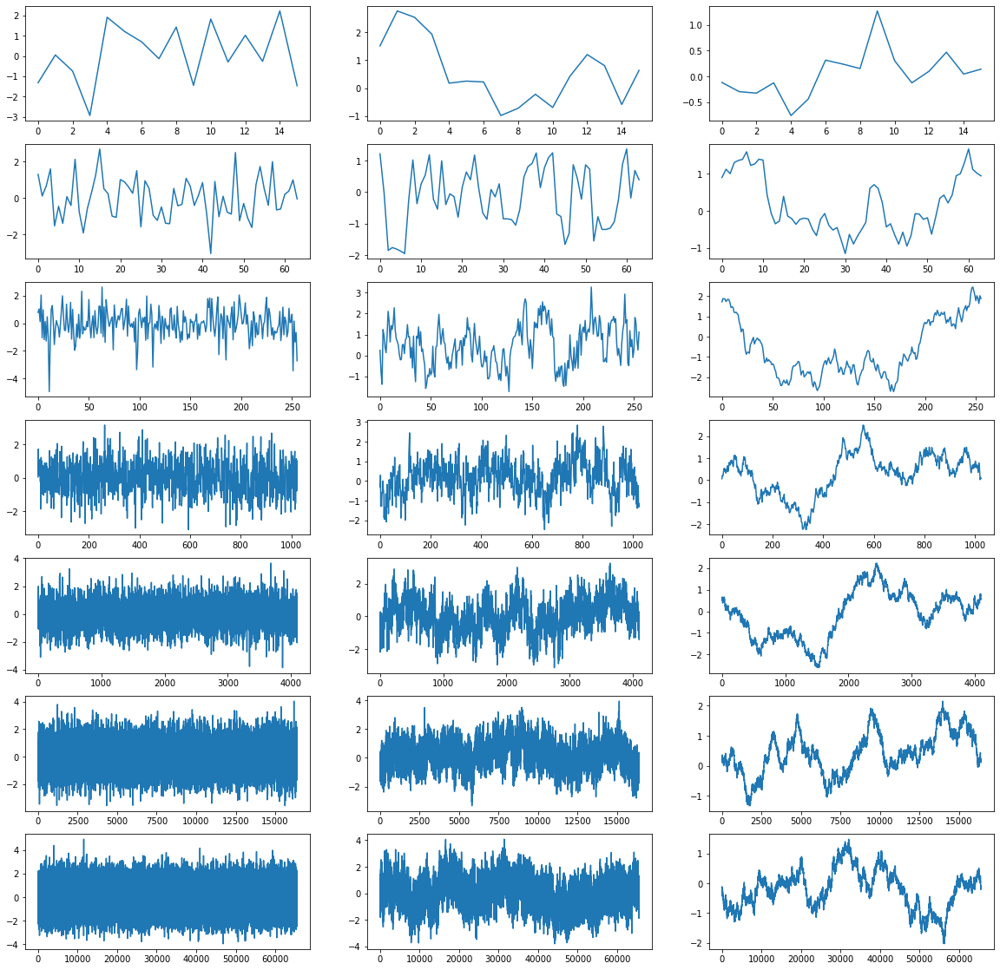

In [11]:
wn, pn, rn = [],[],[]
for i in range(0,7):
    wn.append(cn.powerlaw_psd_gaussian(0, 2**(2*i+4)))
    pn.append(cn.powerlaw_psd_gaussian(1, 2**(2*i+4)))
    rn.append(cn.powerlaw_psd_gaussian(2, 2**(2*i+4)))
plt.figure(figsize=(20,20))
for i in range(len(wn)):
  plt.subplot(len(wn),3,3*i+1)
  
  plt.plot(wn[i])
  plt.subplot(len(pn),3,3*i+2)
  plt.plot(pn[i])
  plt.subplot(len(rn),3,3*i+3)
  plt.plot(rn[i])
  
  

In [11]:
markers = ['o','s','^','v','<','>','p','*','h','H','D','d','P','X','x','|','_',',','.','1','2','3','4','8','+',' ']
W = []
P = []
R = []
for dx in range(0,8):
  #plt.subplot(8,1,dx+1)
  wn = []
  pn = []
  rn = []
  hc_wn = []
  hc_pn = []
  hc_rn = []
  for i in range(0,7):
    wn.append(cn.powerlaw_psd_gaussian(0, 2**(2*i+4)))
    pn.append(cn.powerlaw_psd_gaussian(1, 2**(2*i+4)))
    rn.append(cn.powerlaw_psd_gaussian(2, 2**(2*i+4)))
    hc_wn.append(np.mean([complexity_entropy(wn[i], dx=dx+2) for _ in range(10)],axis=0))
    hc_rn.append(np.mean([complexity_entropy(rn[i], dx=dx+2) for _ in range(10)],axis=0))
    hc_pn.append(np.mean([complexity_entropy(pn[i], dx=dx+2) for _ in range(10)],axis=0))  
  W.append(hc_wn)
  P.append(hc_pn)
  R.append(hc_rn)

In [14]:
# big_wn = cNoise.cNoise(0,(2**15,2**15),maxCorrections=100,maxAvgError=0.001, eta=0.05)
# big_pn = cNoise.cNoise(1,(2**15,2**15),maxCorrections=100,maxAvgError=0.001, eta=0.05)
# big_rn = cNoise.cNoise(2,(2**15,2**15),maxCorrections=100,maxAvgError=0.001, eta=0.05)

In [48]:
dx = 0
i = 0
# Print the max value of the interire array W
print(np.max(W[0]))
np.min(W[dx][0])

0.9999952029767172


0.002569931427348054

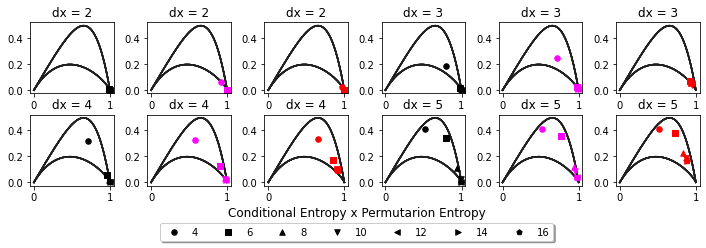

In [82]:
plt.figure(figsize=(12,3))

for dx in range(0,4):
  plt.subplot(2,6,3*dx+2) 
  for i in range(len(pn)): 
    plt.scatter((P[dx][i][0]),(P[dx][i][1]),label = str(int(np.log2(len(pn[i])))), color = 'magenta',marker= markers[i],s=30)#,edgecolor='gray')
    plot_hc((dx+2),show_label_y=False,show_label_x=False,show_legend=False)
    plt.title('dx = '+str(dx+2))
  plt.subplot(2,6,3*dx+3) 
  for i in range(len(rn)): 
    plt.scatter((R[dx][i][0]),(R[dx][i][1]),label = str(int(np.log2(len(rn[i])))), color = 'red',marker= markers[i],s=30)#,edgecolor='gray')
    plot_hc((dx+2),show_label_y=False,show_label_x=False,show_legend=False)
    plt.title('dx = '+str(dx+2))
  plt.subplot(2,6,3*dx+1) 
  for i in range(len(wn)): 
    plt.subplots_adjust(hspace=0.3,wspace=.4)
    plt.scatter((W[dx][i][0]),(W[dx][i][1]),label = str(int(np.log2(len(wn[i])))), color = 'k',marker= markers[i],s=30)#,edgecolor='gray')
    plot_hc((dx+2),show_label_y=False,show_label_x=False,show_legend=False)
    plt.title('dx = '+str(dx+2))
    #plt.xlim()
legend = plt.legend( bbox_to_anchor=(-0.3, -0.85),loc='lower center', ncol=7, fancybox=True, shadow=True)#,prop={'size': 15})         
xlabel = plt.xlabel('Conditional Entropy x Permutarion Entropy',size=12)
xlabel.set_position((-0.3, -0.15)) # position the label at x=0.5 and y=-0.1

#plt.savefig('H_C_diferent_dx.pdf',dpi=300)#,box_inches='tight')
plt.savefig('H_C_diferent_dx.pdf', bbox_extra_artists=(legend,), bbox_inches='tight',dpi=300)



## Bidimensional Case

/home/barauna/anaconda3/lib/python3.8/site-packages/matplotlib/text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


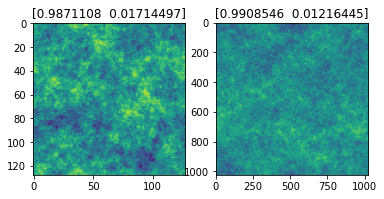

In [39]:
plt.subplot(1,2,1)
plt.imshow(df_data_all2['image'][5])
plt.title(np.mean([complexity_entropy(df_data_all2['image'][5], dx=2, dy=2) for _ in range(10)],axis=0))
plt.subplot(1,2,2)
plt.imshow(df_data_all['image'][5])
plt.title(np.mean([complexity_entropy(df_data_all['image'][5], dx=2, dy=2) for _ in range(10)],axis=0))

plt.show()


In [35]:
hc_2D_wn2 = hc_2D_wn2_SAVE
hc_2D_pn2 = hc_2D_pn2_SAVE
hc_2D_rn2 = hc_2D_rn2_SAVE

NameError: name 'hc_2D_wn2_SAVE' is not defined

In [95]:
hc_2D_wn3 = []
hc_2D_pn3 = []
hc_2D_rn3 = []
dx = [2,3,5,6,7,8]
for i in range(len(dx)):
    hc_2D_wn3.append(np.mean([complexity_entropy(df_data_all2['image'][0], dx=dx[i], dy=dx[i]) for _ in range(10)],axis=0))
    hc_2D_pn3.append(np.mean([complexity_entropy(df_data_all2['image'][5], dx=dx[i], dy=dx[i]) for _ in range(10)],axis=0))
    hc_2D_rn3.append(np.mean([complexity_entropy(df_data_all2['image'][10], dx=dx[i], dy=dx[i]) for _ in range(10)],axis=0))


<ipython-input-91-e3613ecdaa54>:25: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "box_inches" which is no longer supported as of 3.3 and will become an error in 3.6
  plt.savefig('H_C_2D_120.pdf',dpi=300,box_inches='tight')


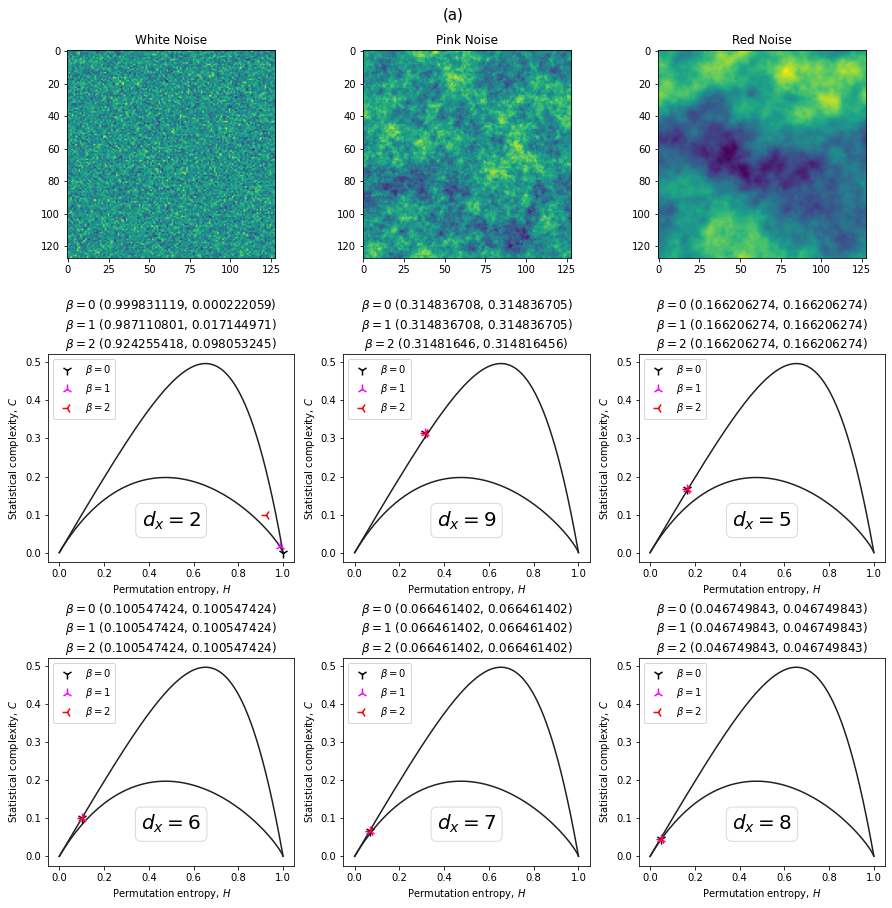

In [91]:

dx = [2,3,5,6,7,8]
plt.figure(figsize=(15,15))
plt.suptitle('(a)',y = .92,fontsize=15)
plt.subplot(3,3,1)
plt.imshow(df_data_all2['image'][0])
plt.title('White Noise')
plt.subplot(3,3,2)
plt.imshow(df_data_all2['image'][5])
plt.title('Pink Noise')
plt.subplot(3,3,3)
plt.imshow(df_data_all2['image'][10])
plt.title('Red Noise')

for i in range(len(dx)):
    #Set a vertical space beteween the plots
    
    plt.subplot(3,3,i+4)
    plt.subplots_adjust(hspace=0.46)
    plot_hc(dx=dx[i])
    plt.scatter((hc_2D_wn3[i][0]),(hc_2D_wn3[i][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
    plt.scatter((hc_2D_pn3[i][0]),(hc_2D_pn3[i][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
    plt.scatter((hc_2D_rn3[i][0]),(hc_2D_rn3[i][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
    plt.legend()
    plt.title(f'$\\beta = 0 $ {round((hc_2D_wn3[i][0]),9),round((hc_2D_wn3[i][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn3[i][0]),9),round((hc_2D_pn3[i][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn3[i][0]),9),round((hc_2D_rn3[i][1]),9)}')
plt.savefig('H_C_2D_120.pdf',dpi=300,box_inches='tight')


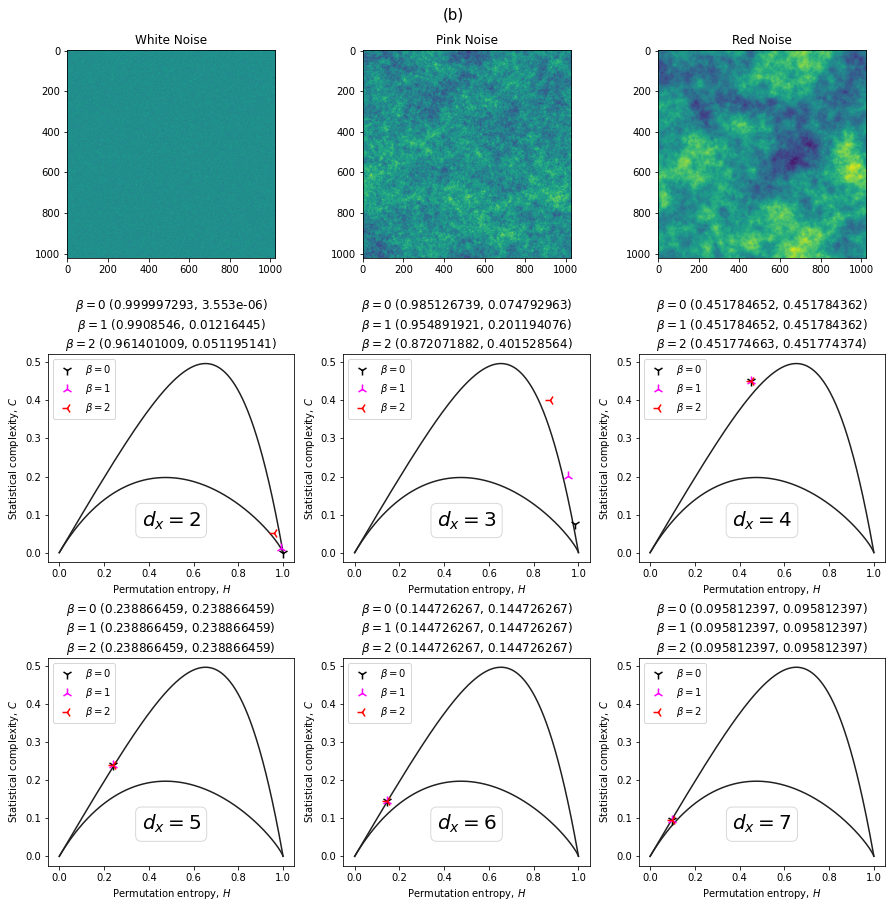

In [92]:

dx = [2,4,5,6,7,8]
plt.figure(figsize=(15,15))
plt.suptitle('(b)',y = .92,fontsize=15)
plt.subplot(3,3,1)
plt.imshow(df_data_all['image'][0])
plt.title('White Noise')
plt.subplot(3,3,2)
plt.imshow(df_data_all['image'][5])
plt.title('Pink Noise')
plt.subplot(3,3,3)
plt.imshow(df_data_all['image'][10])
plt.title('Red Noise')

plt.subplot(3,3,4)
plt.subplots_adjust(hspace=0.46)
plot_hc(dx=2)
plt.scatter((hc_2D_wn2[-1][0]),(hc_2D_wn2[-1][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
plt.scatter((hc_2D_pn2[-1][0]),(hc_2D_pn2[-1][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
plt.scatter((hc_2D_rn2[-1][0]),(hc_2D_rn2[-1][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
plt.legend()
plt.title(f'$\\beta = 0 $ {round((hc_2D_wn2[-1][0]),9),round((hc_2D_wn2[-1][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn2[-1][0]),9),round((hc_2D_pn2[-1][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn2[-1][0]),9),round((hc_2D_rn2[-1][1]),9)}')
for i in range(len(dx)):
    plt.subplot(3,3,i+5)
    plt.subplots_adjust(hspace=0.46)
    plot_hc(dx=dx[i])
    plt.scatter((hc_2D_wn2[i][0]),(hc_2D_wn2[i][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
    plt.scatter((hc_2D_pn2[i][0]),(hc_2D_pn2[i][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
    plt.scatter((hc_2D_rn2[i][0]),(hc_2D_rn2[i][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
    plt.legend()
    plt.title(f'$\\beta = 0 $ {round((hc_2D_wn2[i][0]),9),round((hc_2D_wn2[i][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn2[i][0]),9),round((hc_2D_pn2[i][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn2[i][0]),9),round((hc_2D_rn2[i][1]),9)}')
plt.savefig('H_C_2D_1024.pdf',dpi=300, bbox_inches='tight')


In [214]:
2**7

128

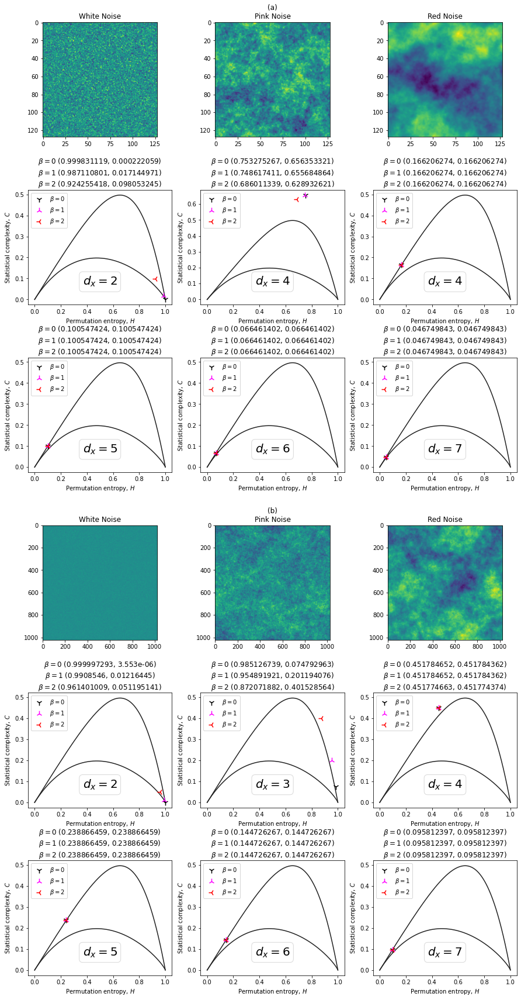

In [101]:

dx = [2,4,4,5,6,7]
plt.figure(figsize=(15,30))
#plt.suptitle('(a)',y = .92,fontsize=15)
plt.subplot(6,3,1)
plt.imshow(df_data_all2['image'][0])
plt.title('White Noise')
plt.subplot(6,3,2)
plt.imshow(df_data_all2['image'][5])
plt.title('(a)\nPink Noise')
plt.subplot(6,3,3)
plt.imshow(df_data_all2['image'][10])
plt.title('Red Noise')

for i in range(len(dx)):
    #Set a vertical space beteween the plots
    
    plt.subplot(6,3,i+4)
    plt.subplots_adjust(hspace=0.46)
    plot_hc(dx=dx[i])
    plt.scatter((hc_2D_wn3[i][0]),(hc_2D_wn3[i][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
    plt.scatter((hc_2D_pn3[i][0]),(hc_2D_pn3[i][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
    plt.scatter((hc_2D_rn3[i][0]),(hc_2D_rn3[i][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
    plt.legend()
    plt.title(f'$\\beta = 0 $ {round((hc_2D_wn3[i][0]),9),round((hc_2D_wn3[i][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn3[i][0]),9),round((hc_2D_pn3[i][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn3[i][0]),9),round((hc_2D_rn3[i][1]),9)}')
#plt.savefig('H_C_2D_120.pdf',dpi=300,box_inches='tight')

dx = [3,4,5,6,7]
#plt.figure(figsize=(15,15))
#plt.suptitle('(b)',y = .92,fontsize=15)
plt.subplot(6,3,10)
plt.imshow(df_data_all['image'][0])
plt.title('White Noise')
plt.subplot(6,3,11)
plt.imshow(df_data_all['image'][5])
plt.title('(b)\nPink Noise')
plt.subplot(6,3,12)
plt.imshow(df_data_all['image'][10])
plt.title('Red Noise')

plt.subplot(6,3,13)
plt.subplots_adjust(hspace=0.46)
plot_hc(dx=2)
plt.scatter((hc_2D_wn2[-1][0]),(hc_2D_wn2[-1][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
plt.scatter((hc_2D_pn2[-1][0]),(hc_2D_pn2[-1][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
plt.scatter((hc_2D_rn2[-1][0]),(hc_2D_rn2[-1][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
plt.legend()
plt.title(f'$\\beta = 0 $ {round((hc_2D_wn2[-1][0]),9),round((hc_2D_wn2[-1][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn2[-1][0]),9),round((hc_2D_pn2[-1][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn2[-1][0]),9),round((hc_2D_rn2[-1][1]),9)}')
for i in range(len(dx)):
    plt.subplot(6,3,i+14)
    plt.subplots_adjust(hspace=0.46)
    plot_hc(dx=dx[i])
    plt.scatter((hc_2D_wn2[i][0]),(hc_2D_wn2[i][1]),label = '$\\beta = 0$', color = 'k', marker='1',s=100)
    plt.scatter((hc_2D_pn2[i][0]),(hc_2D_pn2[i][1]),label = '$\\beta = 1$', color = 'magenta', marker='2',s=100)
    plt.scatter((hc_2D_rn2[i][0]),(hc_2D_rn2[i][1]),label = '$\\beta = 2$', color = 'r', marker='3',s=100)
    plt.legend()
    plt.title(f'$\\beta = 0 $ {round((hc_2D_wn2[i][0]),9),round((hc_2D_wn2[i][1]),9)}\n$\\beta = 1 $ {round((hc_2D_pn2[i][0]),9),round((hc_2D_pn2[i][1]),9)}\n$\\beta = 2 $ {round((hc_2D_rn2[i][0]),9),round((hc_2D_rn2[i][1]),9)}')
plt.savefig('HC_2D.pdf',dpi=300, bbox_inches='tight')


## Radio UIRAPURU data

In [135]:
from astropy.io import fits
hdul = fits.open('/home/barauna/Documentos/P2_FRB/UIRAPURU_20230203_082000_59.fit')
hdul.info()
image_data = hdul[0].data

#Reshapin the data

#image_data = image_data[0:2**int(np.log2(np.shape(image_data)[0])),0:2**int(np.log2(np.shape(image_data)[1]))]
image_data = image_data[:,0:2**int(np.log2(np.shape(image_data)[1]))]
np.shape(image_data)


Filename: /home/barauna/Documentos/P2_FRB/UIRAPURU_20230203_082000_59.fit
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      42   (1800, 400)   uint8   
  1                1 BinTableHDU     16   1R x 2C   [1800D8.3, 400D8.3]   


(400, 1024)

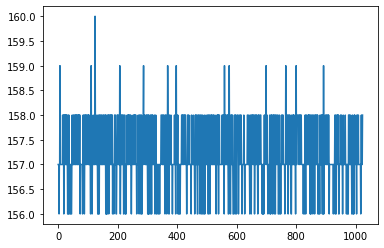

In [143]:
plt.plot(image_data[0])

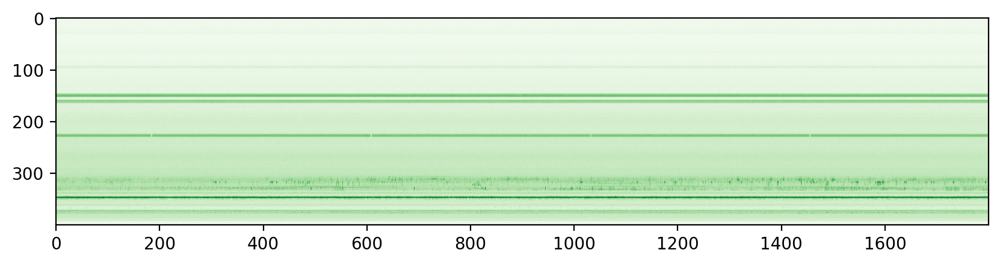

In [53]:
plt.figure(figsize=(10,5),dpi=200)
plt.imshow(image_data, cmap='Greens')#, norm=norm)

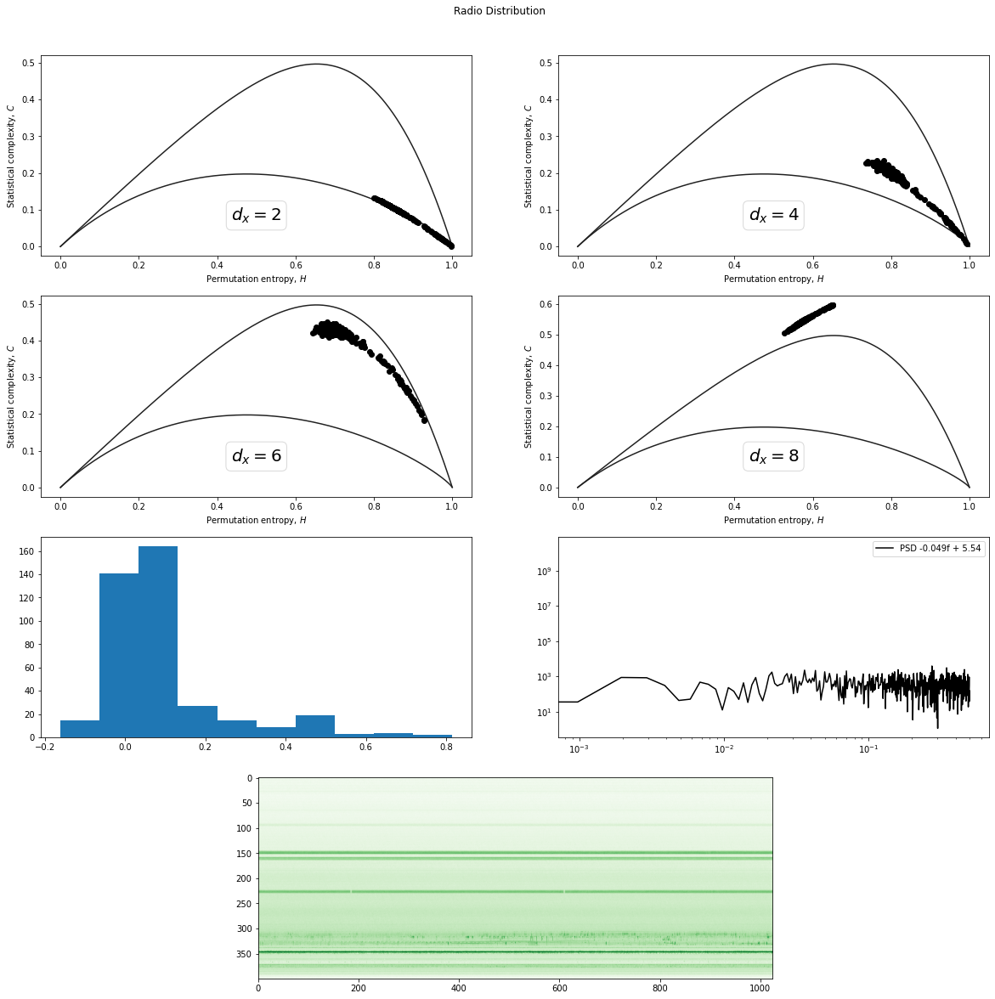

In [93]:
plt.figure(figsize=(20,20))
plt.suptitle('Radio Distribution',y=0.92)
dxs = [2,4,6,8]
for j in range(len(dxs)):
    hc_waterfall = []
    for i in range(len(image_data)): hc_waterfall.append(np.mean([complexity_entropy(image_data[i], dx=dxs[j]) for _ in range(10)],axis=0)) 
    plt.subplot(4,2,j+1)
    for i in range(len(hc_waterfall)): plt.scatter(hc_waterfall[i][0],hc_waterfall[i][1],label = 'Waterfall', color = 'k')
    plot_hc(dxs[j])
plt.subplot(4,2,5)
plt.hist(radio)
plt.subplot(4,2,6)
plot_psd(image_data[0])
plt.legend()
plt.subplot(4,2,(7,8))
plt.imshow(image_data, cmap='Greens')#, norm=norm)
plt.show()

## FRB
1 - Take FRB data

2 - Plot on the HC plane

3 - try to plot_it without the Burst

4 - Compare

In [102]:
#Import Librarys
import pandas as pd
import seaborn as sns
import numpy as np
from scipy.stats import norm
import io
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
from matplotlib.pyplot import figure
import h5py
import scipy
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib import gridspec
from sklearn.preprocessing import MinMaxScaler, MaxAbsScaler
import gdown

## Download Herta Catalog

Here we can decide what data we will use

In [161]:
#!wget "https://www.herta-experiment.org/frbstats/catalogue.csv"
#!wget "https://storage.googleapis.com/chimefrb-dev.appspot.com/catalog1/chimefrbcat1.csv"

#data = pd.read_csv('chimefrbcat1.csv') 
data = pd.read_csv('catalogue.csv') 
df = pd.DataFrame(data)
#Sort by Flux
df = df.sort_values(by=['flux'], ascending=False)

df.head()
max_flux = df.frb[0:6].values 
min_flux = df.frb[-5:].values
#Join max_flux and min_flux in one array
extra = ['FRB 20181213C', 'FRB 20190630D','FRB 20181219B','FRB 20181214D', 'FRB 20181213A']
max_min_flux = np.concatenate((max_flux,extra), axis=0)
max_min_flux


array(['FRB 20181226B', 'FRB 20190404B', 'FRB 20190303B', 'FRB 20190118A',
       'FRB 20171213A', 'FRB 20190417C', 'FRB 20181213C', 'FRB 20190630D',
       'FRB 20181219B', 'FRB 20181214D', 'FRB 20181213A'], dtype=object)

In [336]:
all_frbs = ['FRB20181220B','FRB20181220A','FRB20181219C','FRB20181219B','FRB20181219A','FRB20181218C','FRB20181218B','FRB20181218A','FRB20181217A','FRB20181216A','FRB20181215B','FRB20181215A','FRB20181214F','FRB20181214D','FRB20181214C','FRB20181214B','FRB20181214A','FRB20181213C','FRB20181213B','FRB20181213A','FRB20181209A','FRB20181208A','FRB20181203C','FRB20181203B','FRB20181203A','FRB20181202C','FRB20181202B','FRB20181202A','FRB20181201B','FRB20181201A','FRB20181130A','FRB20181129C','FRB20181129B','FRB20181129A','FRB20181128D','FRB20181128C','FRB20181128B','FRB20181128A','FRB20181127A','FRB20181126A','FRB20181125A','FRB20181124B','FRB20181124A','FRB20181123A','FRB20181122B','FRB20181122A','FRB20181120C','FRB20181120B','FRB20181119E','FRB20181119D','FRB20181119C','FRB20181119B','FRB20181119A','FRB20181118C','FRB20181118B','FRB20181118A','FRB20181117C','FRB20181117B','FRB20181117A','FRB20181116B','FRB20181116A','FRB20181115A','FRB20181104C','FRB20181104B','FRB20181104A','FRB20181102A','FRB20181101A','FRB20181030E','FRB20181030D','FRB20181030C','FRB20181030B','FRB20181030A','FRB20181028A','FRB20181027A','FRB20181025A','FRB20181022E','FRB20181022D','FRB20181022C','FRB20181020A','FRB20181019C','FRB20181019B','FRB20181019A','FRB20181018C','FRB20181018B','FRB20181018A','FRB20181017B','FRB20181017A','FRB20181015A','FRB20181014D','FRB20181014C','FRB20181014B','FRB20181014A','FRB20181013E','FRB20181013C','FRB20181013B','FRB20181013A','FRB20181012B','FRB20180928A','FRB20180925B','FRB20180925A','FRB20180924A','FRB20180923D','FRB20180923C','FRB20180923A','FRB20180922A','FRB20180921A','FRB20180920B','FRB20180920A','FRB20180919B','FRB20180919A','FRB20180918A','FRB20180917B','FRB20180917A','FRB20180916C','FRB20180916B','FRB20180916A','FRB20180915B','FRB20180915A','FRB20180911C','FRB20180911A','FRB20180910A','FRB20180909A','FRB20180908B','FRB20180907E','FRB20180907D','FRB20180907C','FRB20180907B','FRB20180907A','FRB20180906B','FRB20180906A','FRB20180904A','FRB20180817A','FRB20180814B','FRB20180814A','FRB20180812A','FRB20180810B','FRB20180810A','FRB20180806A','FRB20180801A','FRB20180730A','FRB20180729B','FRB20180729A','FRB20180727A','FRB20180725A']

In [162]:
#Take only BINGOs Frenquency
# df_freq = df.copy()
# BINGO_FREQ_MIN =  960
# BINGO_FREQ_MAX = 1260
# df_freq.drop(df_freq[df_freq['frequency'] > BINGO_FREQ_MAX].index, inplace = True)
# df_freq.drop(df_freq[df_freq['frequency'] < BINGO_FREQ_MIN].index, inplace = True)
#list = df_freq.frb.values
#df = df.sort_values(by=['flux'])
list = df.frb.values
list = max_min_flux
#list = max_flux
for i in range(len(list)): list[i] = list[i][0:3] + list[i][-9:]
list = list[0:10]
list

array(['FRB20181226B', 'FRB20190404B', 'FRB20190303B', 'FRB20190118A',
       'FRB20171213A', 'FRB20190417C', 'FRB20181213C', 'FRB20190630D',
       'FRB20181219B', 'FRB20181214D'], dtype=object)

In [173]:
#Prepare for Downloading
#frbs_adress = ['FRB20190701E','FRB20190701D','FRB20190701C','FRB20190701B','FRB20190701A','FRB20190630D'] 
frbs_adress = list
#frbs_adress = all_frbs

path = 'https://www.cadc-ccda.hia-iha.nrc-cnrc.gc.ca/files/vault/AstroDataCitationDOI/CISTI.CANFAR/21.0007/data/waterfalls/data/'
files = [] 
for i in range(len(frbs_adress)):files.append(f'{path}{frbs_adress[i]}_waterfall.h5')

In [174]:
for i in range(len(files)):
    #Check if file exists
    if os.path.isfile(f'{frbs_adress[i]}_waterfall.h5'):
        print(f'{frbs_adress[i]}_waterfall.h5 already exists')
    else:
        # #Downloading with `files` url
        try:
            gdown.download(files[i])
            print(f'{frbs_adress[i]}_waterfall.h5 DOWLOADED')
        except:
            print(f'{frbs_adress[i]}_waterfall.h5 ERROR IN URL')      

FRB20181226B_waterfall.h5 already exists
FRB20190404B_waterfall.h5 already exists
FRB20190303B_waterfall.h5 already exists
FRB20190118A_waterfall.h5 already exists
FRB20171213A_waterfall.h5 already exists
FRB20190417C_waterfall.h5 already exists
FRB20181213C_waterfall.h5 already exists
FRB20190630D_waterfall.h5 already exists
FRB20181219B_waterfall.h5 already exists
FRB20181214D_waterfall.h5 already exists


In [175]:
# #Downloading with `files` url
# for i in range(len(files)): 
#     try:
#         gdown.download(files[i])
#     except:
#         pass

In [176]:
# Definindo vetor vazio
#List all files with .h5 extension
#files = glob.glob('*.h5')
#files
file_name = []
# Alocando o nome dos arquivos que foram baixado
for i in range(len(files)): file_name.append(files[i][-25:])
for i in range(len(files)): file_name[i] = '/home/barauna/Documentos/PN_Vision_Noise/'+file_name[i]

In [178]:
file_name = file_name[1:]
len(file_name)

8

## Reading Dowloaded files

In [179]:
#Redind and alocatind data

wfalls           = []
model_specs      = [] 
eventnames       = []
wfalls           = []
model_wfalls     = []
plot_times       = []
plot_freqs       = []
tss              = []
model_tss        = []
specs            = []
model_specs      = []
extents          = []
dms              = []
scatterfits      = []
cal_obs_dates    = []
cal_source_names = []
cal_wfalls       = []

for i in range(len(file_name)):
  try:
    eventnames.append(       h5py.File(file_name[i], "r")["frb"].attrs["tns_name"].decode())
    wfalls.append(           h5py.File(file_name[i], "r")["frb"]["wfall"][:])
    model_wfalls.append(     h5py.File(file_name[i], "r")["frb"]["model_wfall"][:])
    plot_times.append(       h5py.File(file_name[i], "r")["frb"]["plot_time"][:])
    plot_freqs.append(       h5py.File(file_name[i], "r")["frb"]["plot_freq"][:])
    tss.append(              h5py.File(file_name[i], "r")["frb"]["ts"][:])
    model_tss.append(        h5py.File(file_name[i], "r")["frb"]["model_ts"][:])
    specs.append(            h5py.File(file_name[i], "r")["frb"]["spec"][:])
    model_specs.append(      h5py.File(file_name[i], "r")["frb"]["model_spec"][:])
    extents.append(          h5py.File(file_name[i], "r")["frb"]["extent"][:])
    dms.append(              h5py.File(file_name[i], "r")["frb"].attrs["dm"][()])
    scatterfits.append(      h5py.File(file_name[i], "r")["frb"].attrs["scatterfit"][()])
    cal_obs_dates.append(    h5py.File(file_name[i], "r")["frb"].attrs["calibration_observation_date"].decode())
    cal_source_names.append( h5py.File(file_name[i], "r")["frb"].attrs["calibration_source_name"].decode())
    cal_wfalls.append(       h5py.File(file_name[i], "r")["frb"]["calibrated_wfall"][:])
  except:
    pass

## Functions

In [180]:
#Creating the bin_frqs function
# Essa funação tem como somar os canais originais. 
def bin_freq_channels(data, fbin_factor=4):
    num_chan = data.shape[0]
    if num_chan % fbin_factor != 0:
        raise ValueError("frequency binning factor `fbin_factor` should be even")
    data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)
    return data

In [181]:
def clean_outliers(data, time_std=2, norm=True, in_row=True):
    if norm == True: 
        data        = (data - np.nanmin(data)) /(np.nanmax(data) - np.nanmin(data))     
    
    if in_row:        
        # Calculate the mean and standard deviation of each row
        mean = np.nanmean(data, axis=1, keepdims=True)
        std  = np.nanstd( data, axis=1, keepdims=True)

        # Set the threshold for replacing values
        threshold1 = mean + time_std * std
        threshold2 = mean - time_std * std

        # Loop through the data and replace any values above the threshold
        data_clean = np.copy(data)
        data_signal = np.zeros_like(data)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                if data_clean[i, j] > threshold1[i] or data_clean[i, j] < threshold2[i]: 
                    data_signal[i, j] = data_clean[i, j]
                    data_clean[i, j] = mean[i] + np.random.normal(scale=std[i]/2)
    
    else:
        # Calculate the mean and standard deviation of the data
        # mean = np.nanmean(data[0])
        # std = np.nanstd(data[0])

        mean = min(np.nanmean(data, axis=1, keepdims=True))
        std  = min(np.nanstd(data, axis=1, keepdims=True))

        # Set the threshold for replacing values
        threshold1 = mean + time_std * std
        threshold2 = mean - time_std * std

        # Loop through the data and replace any values above the threshold
        data_clean = np.copy(data)
        data_signal = np.zeros_like(data)
        for i in range(data.shape[0]):
            for j in range(data.shape[1]):
                if data_clean[i, j] > threshold1 or data_clean[i, j] < threshold2:
                    data_signal[i, j] = data_clean[i, j]
                    data_clean[i, j] = mean + np.random.normal(scale=std)
    
    return data, data_clean, data_signal


In [182]:
len(wfalls)

7

<ipython-input-180-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)
<ipython-input-181-d64605290c07>:28: RuntimeWarning: Mean of empty slice
  mean = min(np.nanmean(data, axis=1, keepdims=True))
<ipython-input-180-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)
<ipython-input-181-d64605290c07>:28: RuntimeWarning: Mean of empty slice
  mean = min(np.nanmean(data, axis=1, keepdims=True))
/home/barauna/anaconda3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1664: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
<ipython-input-180-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)
<ipython-input-181-d64605290c07>:28:

<Figure size 720x1440 with 0 Axes>

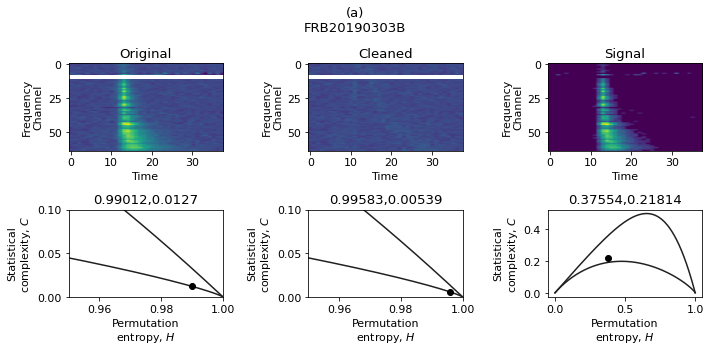

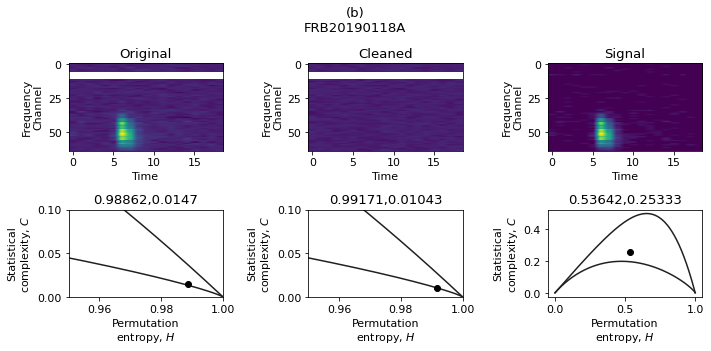

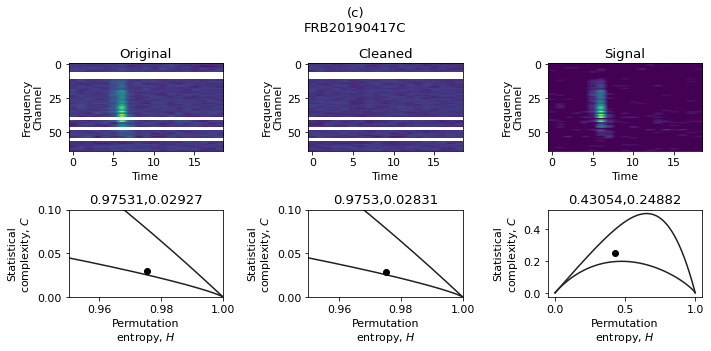

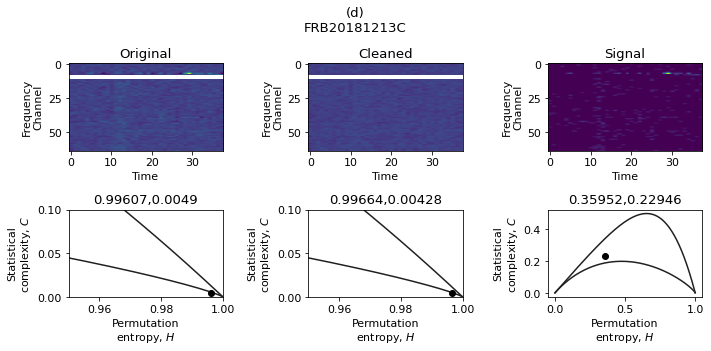

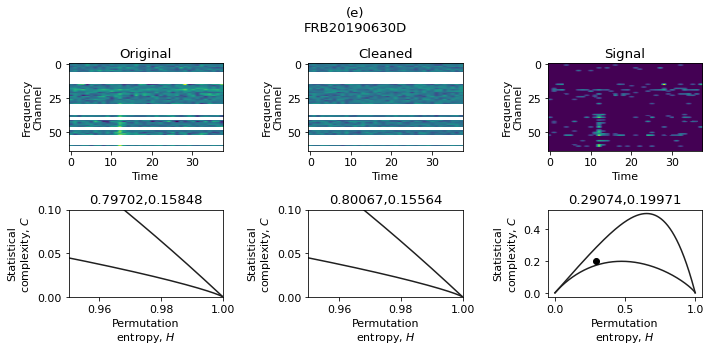

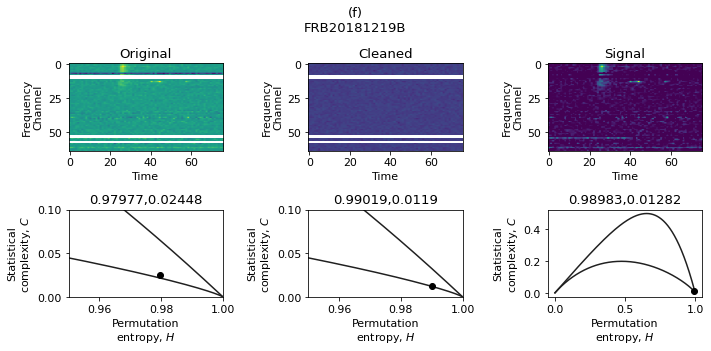

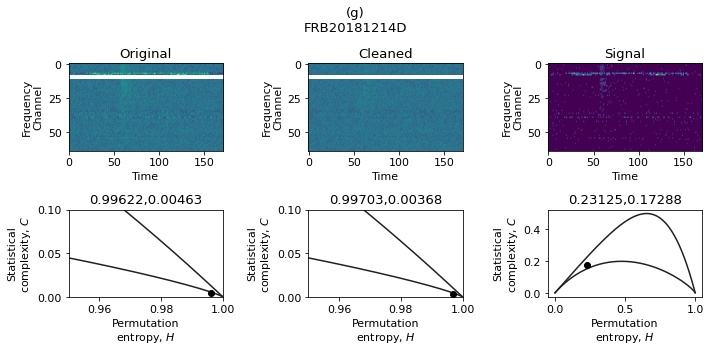

In [201]:
letters = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)','(m)','(n)','(o)','(p)','(q)','(r)','(s)','(t)','(u)','(v)','(w)','(x)','(y)','(z)']
plt.figure(figsize=(10,20))
plt.rcParams.update({'font.size': 11})
for l in range(0,len(wfalls)):
    sigmas = 3
    dxs = 2
    data = bin_freq_channels(wfalls[l],2**8)
    #hc_data = complexity_entropy(data, dx = dxs,dy = dxs)
    a,b,c = clean_outliers(data,sigmas,norm=False,in_row=False)
    hc_a = complexity_entropy(a, dx = dxs,dy = dxs)
    hc_b = complexity_entropy(b, dx = dxs,dy = dxs)
    hc_c = complexity_entropy(c, dx = dxs,dy = dxs)
    plt.figure(figsize=(10,5))
    plt.suptitle(f'{letters[l]}\n{eventnames[l]}',y=0.97)
    plt.subplot(2,3,1)
    plt.imshow(a,vmin=np.nanmin(a),vmax=np.nanmax(a),aspect='auto')
    plt.ylabel('Frequency\nChannel')
    plt.xlabel('Time')
    plt.title('Original')
    plt.subplot(2,3,2)
    plt.imshow(b,vmin=np.nanmin(a),vmax=np.nanmax(a),aspect='auto')
    plt.title('Cleaned')
    plt.ylabel('Frequency\nChannel')
    plt.xlabel('Time')
    plt.subplot(2,3,3)
    plt.imshow(c,vmin=0,vmax=np.nanmax(a),aspect='auto')
    plt.title('Signal')
    plt.ylabel('Frequency\nChannel')
    plt.xlabel('Time')    
    plt.subplot(2,3,4)
    plt.scatter(hc_a[0],hc_a[1],c='k')
    plt.title(f'{round(hc_a[0],5)},{round(hc_a[1],5)}')
    plot_hc(dxs,False)
    plt.ylim(0,0.1)
    plt.xlim(0.95,1)
    plt.subplot(2,3,5)
    plt.scatter(hc_b[0],hc_b[1],c='k')
    plt.title(f'{round(hc_b[0],5)},{round(hc_b[1],5)}')
    plot_hc(dxs,False)
    plt.ylim(0,0.1)
    plt.xlim(0.95,1)
    plt.subplot(2,3,6)
    plt.scatter(hc_c[0],hc_c[1],c='k')
    plt.title(f'{round(hc_c[0],5)},{round(hc_c[1],5)}')
    plot_hc(dxs,False)
    # plt.ylim(0,0.1)
    # plt.xlim(0.95,1)
    plt.tight_layout()
    plt.savefig(f'HC_{eventnames[l]}.pdf',dpi=300,bbox_inches='tight')

<ipython-input-154-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


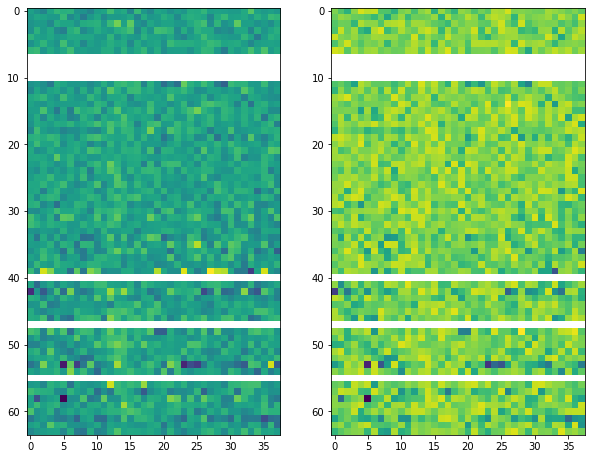

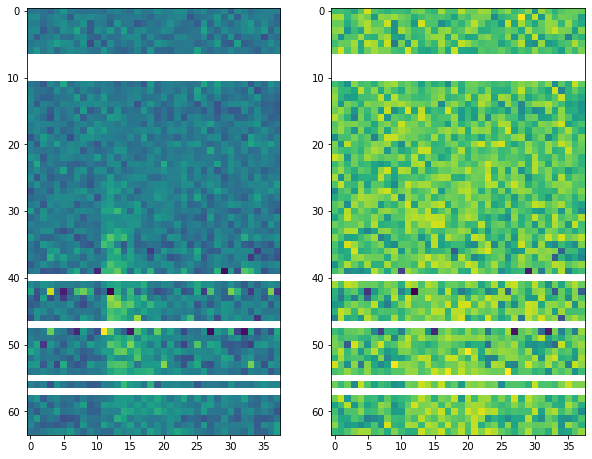

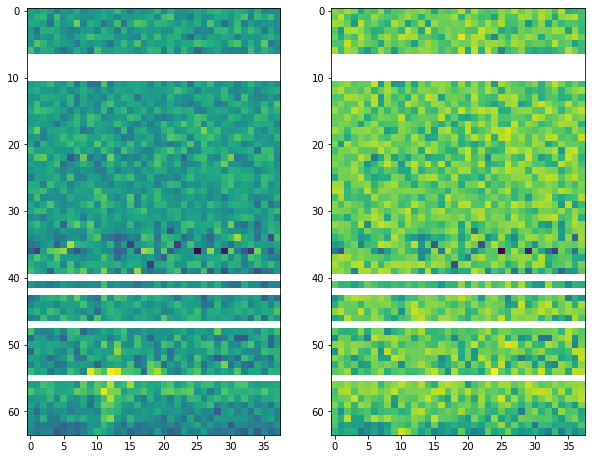

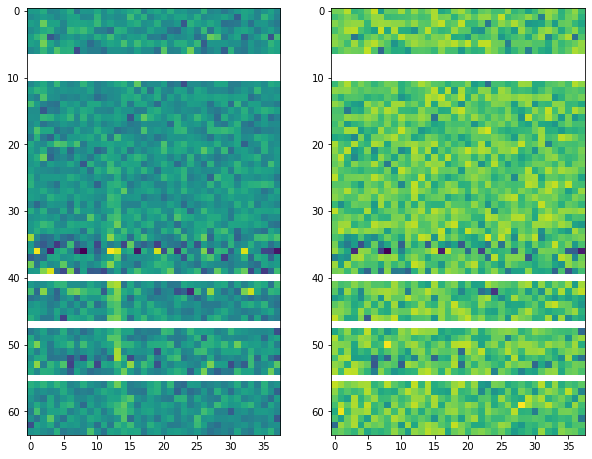

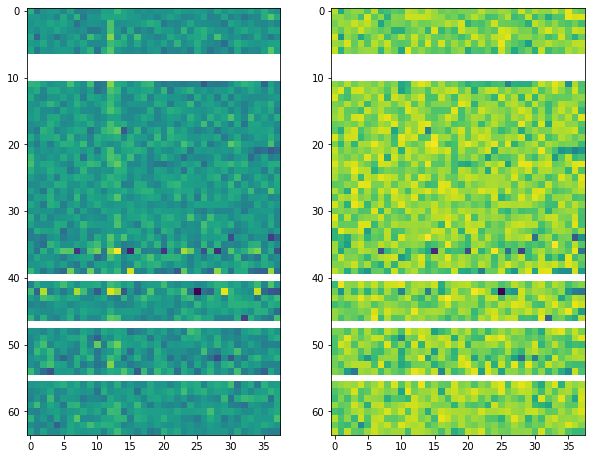

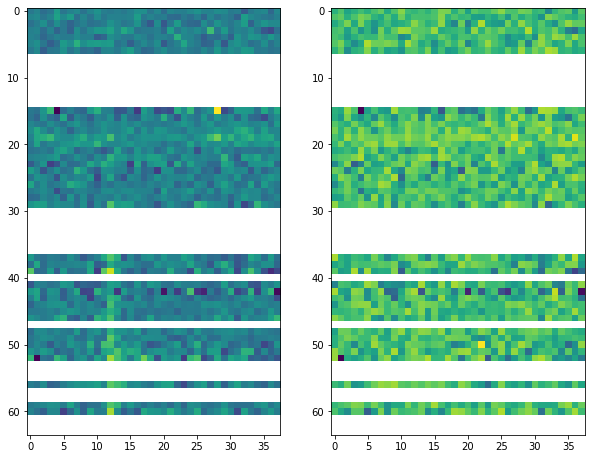

In [250]:
k = 3
for k in range(len(wfalls)):
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.imshow(bin_freq_channels(wfalls[k],256))
    plt.subplot(1,2,2)
    plt.imshow(wfalls_noise[k])

In [223]:
bin_freq_channels(wfalls[k],256)

TypeError: only integer scalar arrays can be converted to a scalar index

In [251]:
import numpy as np

def clean_outliers(data, norm=False):
    # Calculate the mean and standard deviation of the data
    mean = np.nanmean(data)
    std = np.nanstd(data)

    # Set the threshold for replacing values
    threshold = mean + 2 * std

    # Loop through the data and replace any values above the threshold
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            if data[i, j] > threshold:
                data[i, j] = mean + np.random.normal(scale=std/2)
    
    # Normalize the data if requested
    if norm:
        data_norm = (data - np.min(data)) / (np.max(data) - np.min(data))
        return data_norm
    else:
        return data


In [244]:
wfalls_noise = []
for i in range(len(wfalls)): 
    wfalls_noise.append(clean_outliers(bin_freq_channels(wfalls[i],256),1))

<ipython-input-154-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


<ipython-input-6-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


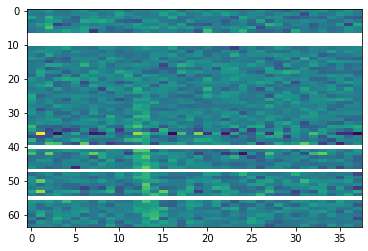

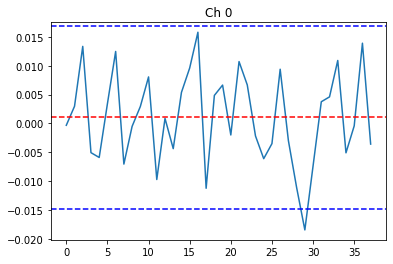

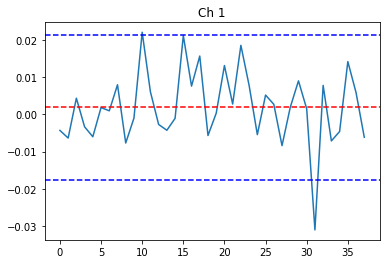

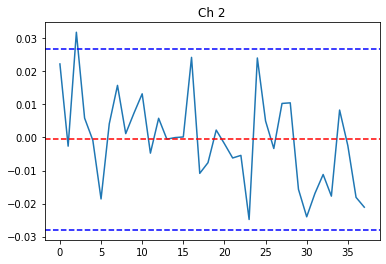

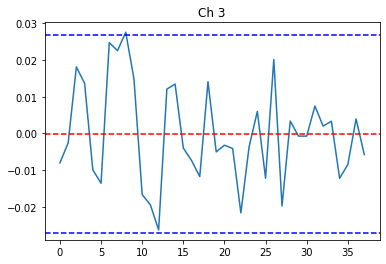

...

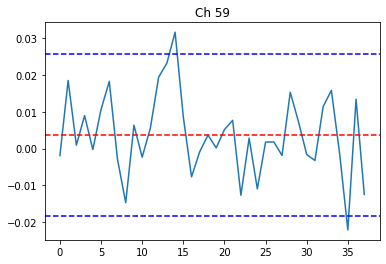

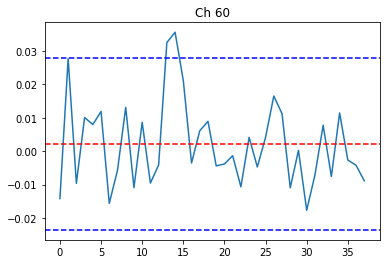

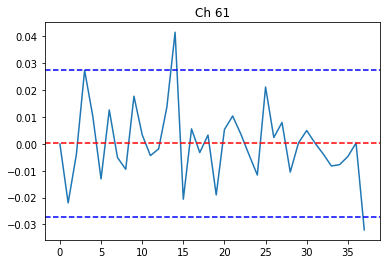

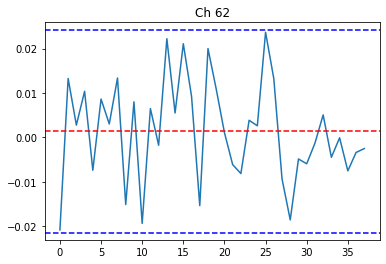

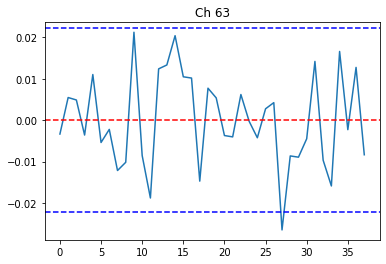

IndexError: index 64 is out of bounds for axis 0 with size 64

In [128]:
#plt.figure(figsize=(10,10),dpi=80)
plt.imshow(bin_freq_channels(wfalls[k],256),aspect='auto')
plt.show()
len(bin_freq_channels(wfalls[k],256))
k = 3
for i in range(len(wfalls[k])):
    plt.plot(bin_freq_channels(wfalls[k],256)[i])
    plt.title(f'Ch {i}')
    plt.axhline(y=np.mean(bin_freq_channels(wfalls[k],256)[i]),linestyle='--',color='r')
    plt.axhline(y=np.mean(bin_freq_channels(wfalls[k],256)[i])+2*np.std(bin_freq_channels(wfalls[k],256)[i]),linestyle='--',color='b')
    plt.axhline(y=np.mean(bin_freq_channels(wfalls[k],256)[i])-2*np.std(bin_freq_channels(wfalls[k],256)[i]),linestyle='--',color='b')
    plt.show()

In [126]:
def clean_timeseries(ts,times_sts=2):
    '''
    Fuction to clear outliers largers then `times_std` times the standart deviation
    '''
    mean = np.mean(ts)
    std = np.std(ts)
    ts_copy = ts.copy()
    threshold = times_sts * std
    for i in range(len(ts_copy)):
        if np.abs(ts_copy[i] - mean) > threshold:
            ts_copy[i] = mean + np.random.normal(0, std/2)
    return ts_copy


In [ ]:
wfalls[0] clean_timeseries

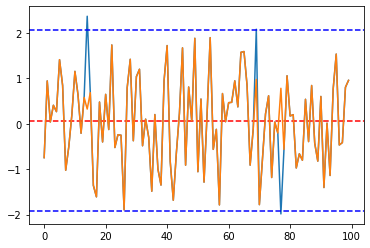

In [79]:
import numpy as np

# Generate a sample time series
ts = np.random.normal(0, 1, size=100)

# Calculate the mean and standard deviation of the time series
mean = np.mean(ts)
std = np.std(ts)

# Define the threshold value
threshold = 2 * std

# Create a copy of the time series
ts_copy = ts.copy()

# Replace values that exceed the threshold with mean + noise
for i in range(len(ts_copy)):
    if np.abs(ts_copy[i] - mean) > threshold:
        ts_copy[i] = mean + np.random.normal(0, std/2)

# Return the modified time series
print(ts_copy)

plt.plot(ts)
plt.axhline(np.mean(ts),linestyle='--',c='r')
plt.axhline(np.mean(ts)+2*np.std(ts),linestyle='--',c='b')
plt.axhline(np.mean(ts)-2*np.std(ts),linestyle='--',c='b')
plt.plot(ts_copy)



<ipython-input-6-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


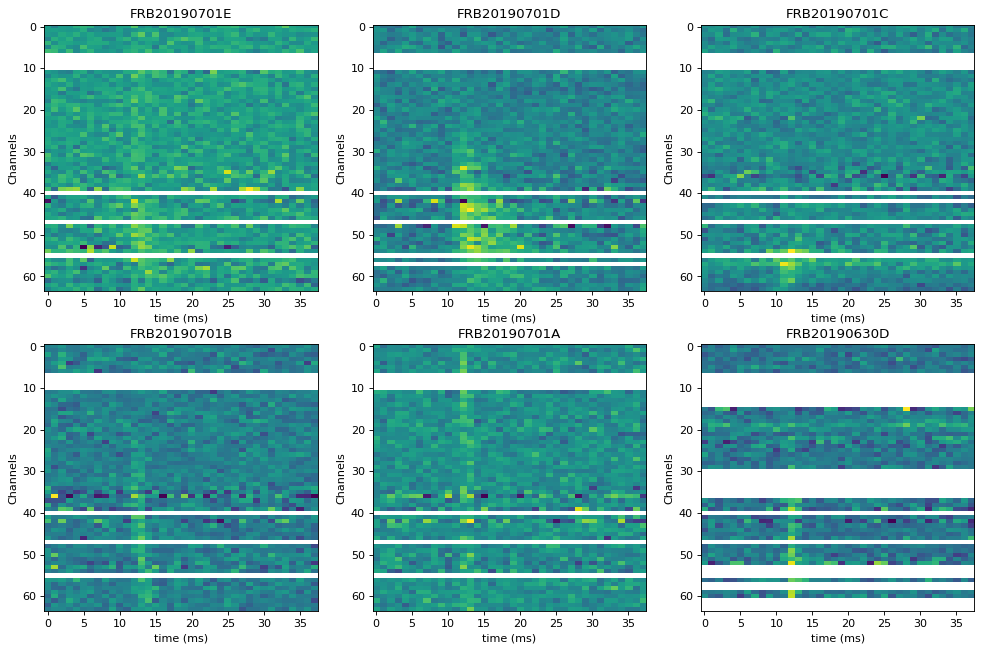

In [7]:
#Ploting FRBS Waterfall
n_rows, n_collums = 3,3
bins = 256
plt.figure(figsize=(15,15),dpi=80)
for i in range(len(files)):
  x = bin_freq_channels(wfalls[i],bins)
  plt.subplot(n_rows,n_collums,i+1)
  plt.imshow(x, aspect="auto")
  plt.title(eventnames[i])
  plt.ylabel('Channels')
  plt.xlabel('time (ms)')
  #plt.yticks(400, 500, 600, 700, 800])

In [8]:
markers = ['o', 'v', '^', '<', '>', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']

<ipython-input-110-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


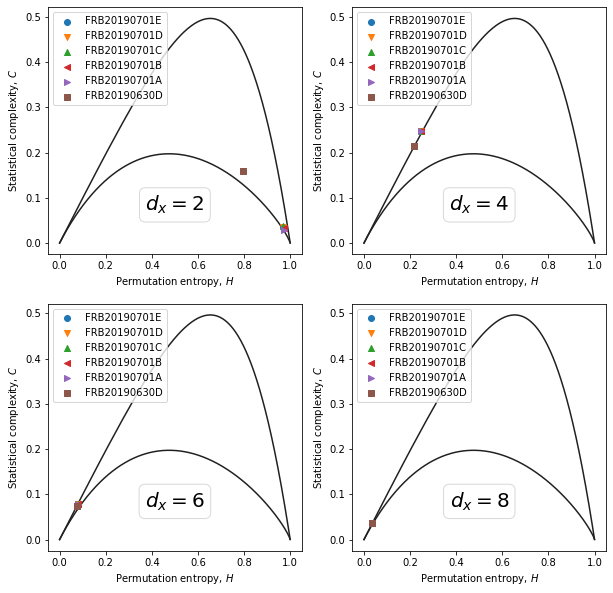

In [115]:
dx = [2,4,6,8]
plt.figure(figsize=(10,10))
for k in range(len(dx)):
    plt.subplot(2,2,k+1)
    hc_frbs = []
    for i in range(len(files)):
      frb = bin_freq_channels(wfalls[i],bins)
      hc_frbs.append(np.mean([complexity_entropy(frb, dx=dx[k], dy=dx[k]) for _ in range(10)],axis=0))
    for j in range(len(hc_frbs)):
        plt.scatter(hc_frbs[j][0], hc_frbs[j][1],marker=markers[j],label = eventnames[j])
        plt.legend()
    plot_hc(dx[k])  

<ipython-input-59-444c7ba569ae>:7: RuntimeWarning: Mean of empty slice
  data = np.nanmean(data.reshape((num_chan // fbin_factor, fbin_factor) + data.shape[1:]), axis=1)


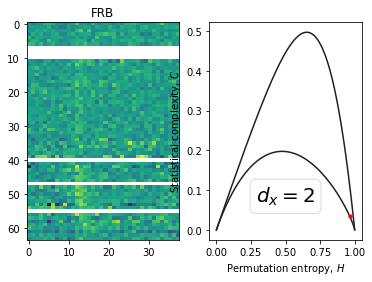

In [81]:

frb = bin_freq_channels(wfalls[0],bins)
hc_frb = np.mean([complexity_entropy(frb, dx=2, dy=2) for _ in range(10)],axis=0)
plt.subplot(1,2,1)
plt.imshow(frb , aspect="auto")
plt.title('FRB')
plt.subplot(1,2,2)
plt.scatter(hc_frb[0], hc_frb[1], c='r', s=10)
plot_hc(dx=2)